#    Prétraitement des données

# Los Angeles Crime Data from 2020 to 2023
## objectif: 
Comprendre les tendances des crimes non résolus, les caractéristiques des victimes,les types de crimes les plus courants.
Ce modèle permet de prédire le type de crime à partir des caractéristiques suivantes :

* Vict Age: L'âge de la victime.
* Vict Sex: Le sexe de la victime.
* Vict Descent: La descente ethnique de la victime.
* LAT: La latitude de l'emplacement de l'incident.
* LON: La longitude de l'emplacement de l'incident.
* Crm Cd: Le code numérique associé à la catégorie générale du crime.
* Weapon Used Cd: Le code numérique associé à l'arme utilisée.
* Status: Le statut de l'incident.
* AREA: Le code de la zone où l'incident a eu lieu.

In [1]:
# importer les packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, precision_score, recall_score
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest, chi2
import pickle

##### => impoter les bibliothéques et les packages.

### Lecture du mon fichier qui est de format csv

In [2]:

sheet = pd.read_csv(r"C:\Users\user\Desktop\projetdatamining\Crime_Data_from_2020_to_Present.csv\Crime_Data_from_2020_to_Present.csv")

In [3]:
#Mettre le fichier dans un DataFrame
df=pd.DataFrame(sheet)

In [4]:
# Affichage des premières lignes pour vérification
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


# **Data Exploration**

In [5]:
#informations sur les données
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 743817 entries, 0 to 743816
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           743817 non-null  int64  
 1   Date Rptd       743817 non-null  object 
 2   DATE OCC        743817 non-null  object 
 3   TIME OCC        743817 non-null  int64  
 4   AREA            743817 non-null  int64  
 5   AREA NAME       743817 non-null  object 
 6   Rpt Dist No     743817 non-null  int64  
 7   Part 1-2        743817 non-null  int64  
 8   Crm Cd          743817 non-null  int64  
 9   Crm Cd Desc     743817 non-null  object 
 10  Mocodes         641793 non-null  object 
 11  Vict Age        743817 non-null  int64  
 12  Vict Sex        646777 non-null  object 
 13  Vict Descent    646771 non-null  object 
 14  Premis Cd       743808 non-null  float64
 15  Premis Desc     743393 non-null  object 
 16  Weapon Used Cd  258193 non-null  float64
 17  Weapon Des

*`=>Signification de chaque colonne.`*
* AREA: Le code de la zone où l'incident a eu lieu.
* AREA NAME: Le nom de la zone où l'incident a eu lieu.
* Crm Cd: Le code numérique associé à la catégorie générale du crime.
* Crm Cd 1, Crm Cd 2, Crm Cd 3, Crm Cd 4: Les codes supplémentaires associés au crime.
* Crm Cd Desc: La description du crime.
* DATE OCC: La date à laquelle l'incident s'est produit.
* DR_NO: Le numéro de rapport de l'incident.
* Date Rptd: La date à laquelle l'incident a été rapporté.
* LAT: La latitude de l'emplacement de l'incident.
* LON: La longitude de l'emplacement de l'incident.
* Mocodes: Les codes supplémentaires associés au mode de crime.
* Part 1-2: Indicateur si le crime fait partie des catégories principales (Part 1) ou secondaires (Part 2).
* Premis Cd: Le code numérique associé au type de localisation de l'incident.
* Premis Desc: La description du type de localisation de l'incident.
* Rpt Dist No: Le numéro de district de rapport.
* Status: Le statut de l'incident.
* Status Desc: La description du statut de l'incident.
* TIME OCC: L'heure à laquelle l'incident s'est produit.
* Vict Age: L'âge de la victime.
* Vict Descent: La descente ethnique de la victime.
* Vict Sex: Le sexe de la victime.
* Weapon Desc: La description de l'arme utilisée.
* Weapon Used Cd: Le code numérique associé à l'arme utilisée.
*Cross street:a rue transversale où l'incident signalé a eu lieu

In [6]:
# Sélectionner les variables catégorielles
categorical_columns = df.select_dtypes(exclude=['number']).columns

# Afficher les noms des variables catégorielles
print("Variables catégorielles dans l'ensemble de données :")
print(categorical_columns)


Variables catégorielles dans l'ensemble de données :
Index(['Date Rptd', 'DATE OCC', 'AREA NAME', 'Crm Cd Desc', 'Mocodes',
       'Vict Sex', 'Vict Descent', 'Premis Desc', 'Weapon Desc', 'Status',
       'Status Desc', 'LOCATION', 'Cross Street'],
      dtype='object')


*`=> Dans notre base de données nous avons 13 colonnes dont le type set catégorielles. Area est manquante elle est considéré comme numérique il faut le changer en catégorielle`*

In [7]:
# vérifier s'il existe des données en double 
df.duplicated().sum()

0

*`=> Nous obtenons comme resultat 0 ligne dupliqué.`*

In [8]:
# Vérification des valeurs manquantes par colonne
print(df.isnull().sum())

DR_NO                  0
Date Rptd              0
DATE OCC               0
TIME OCC               0
AREA                   0
AREA NAME              0
Rpt Dist No            0
Part 1-2               0
Crm Cd                 0
Crm Cd Desc            0
Mocodes           102024
Vict Age               0
Vict Sex           97040
Vict Descent       97046
Premis Cd              9
Premis Desc          424
Weapon Used Cd    485624
Weapon Desc       485624
Status                 0
Status Desc            0
Crm Cd 1               9
Crm Cd 2          688731
Crm Cd 3          741978
Crm Cd 4          743763
LOCATION               0
Cross Street      624067
LAT                    0
LON                    0
dtype: int64


*`=> Les colonnes "Mocodes", "Vict Sex", "Vict Descent", "Weapon Used Cd", "Weapon Desc", "Crm Cd 2", "Crm Cd 3", "Crm Cd 4" et "Cross Street" ont un nombre significatif de valeurs manquantes.Les colonnes "Premis Cd" et "Premis Desc" ont également quelques valeurs manquantes, mais en comparaison, elles sont moins nombreuses `*

In [9]:
# afficher les statistiques descriptives pour les données numériques avant d'effectuer les changements
df.describe()

,DR_NO,TIME OCC,AREA,Rpt Dist No,Part 1-2,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON
count,7.438170e+05,743817.000000,743817.000000,743817.000000,743817.000000,743817.000000,743817.000000,743808.000000,258193.000000,743808.000000,55086.000000,1839.000000,54.000000,743817.000000,743817.000000
mean,2.145867e+08,1334.877319,10.717617,1118.155374,1.415971,500.929161,29.920445,305.927261,362.581739,500.669532,957.231384,983.693312,989.925926,33.969753,-117.993467
std,1.019061e+07,653.669683,6.092044,609.211199,0.492889,207.982265,21.723517,216.805718,123.675447,207.771223,111.982666,51.595992,29.327591,1.881087,6.523385
min,8.170000e+02,1.000000,1.000000,101.000000,1.000000,110.000000,-2.000000,101.000000,101.000000,110.000000,210.000000,434.000000,821.000000,0.000000,-118.667600
25%,2.021079e+08,900.000000,6.000000,622.000000,1.000000,331.000000,11.000000,101.000000,309.000000,331.000000,998.000000,998.000000,998.000000,34.013300,-118.429500
50%,2.118209e+08,1415.000000,11.000000,1142.000000,1.000000,442.000000,31.000000,203.000000,400.000000,442.000000,998.000000,998.000000,998.000000,34.058500,-118.321400
75%,2.214132e+08,1900.000000,16.000000,1618.000000,2.000000,626.000000,45.000000,501.000000,400.000000,626.000000,998.000000,998.000000,998.000000,34.163000,-118.273900
max,2.399165e+08,2359.000000,21.000000,2199.000000,2.000000,956.000000,120.000000,974.000000,516.000000,956.000000,999.000000,999.000000,999.000000,34.334300,0.000000


In [10]:
# Gérer les valeurs manquantes et nettoyer les colonnes catégorielles une par une
columns_to_clean = ['Vict Descent', 'Premis Desc', 'Weapon Desc']

# Nettoyage pour la colonne 'Vict Descent'
# Remplacer les valeurs manquantes par 'Inconnu' et convertir en majuscules
df['Vict Descent'] = df['Vict Descent'].fillna('not mentionned').str.upper()

# Nettoyage pour la colonne 'Premis Desc'
# Remplacer les valeurs manquantes par 'Inconnu' et convertir en majuscules
df['Premis Desc'] = df['Premis Desc'].fillna('Inconnu').str.upper()
# Nettoyage pour la colonne 'Weapon Desc'
# Remplacer les valeurs manquantes par 'Inconnu' et convertir en majuscules
df['Weapon Desc'] = df['Weapon Desc'].fillna('Inconnu').str.upper()
df['Weapon Desc'].isnull().sum()
df['Premis Desc'].isnull().sum()
df['Vict Descent'].isnull().sum()

0

*`=> Nous avons remplacé les valeurs manquentes et nous avons effectué un test pour voir s'il existe d'autres valeurs manquantes ou non dans les colonnes . 'Vict Descent', 'Premis Desc', 'Weapon Desc'.Le résultat du test est 0.`*

In [11]:
# veifier de nouveau les types de chaque colonne
df.dtypes

DR_NO               int64
Date Rptd          object
DATE OCC           object
TIME OCC            int64
AREA                int64
AREA NAME          object
Rpt Dist No         int64
Part 1-2            int64
Crm Cd              int64
Crm Cd Desc        object
Mocodes            object
Vict Age            int64
Vict Sex           object
Vict Descent       object
Premis Cd         float64
Premis Desc        object
Weapon Used Cd    float64
Weapon Desc        object
Status             object
Status Desc        object
Crm Cd 1          float64
Crm Cd 2          float64
Crm Cd 3          float64
Crm Cd 4          float64
LOCATION           object
Cross Street       object
LAT               float64
LON               float64
dtype: object

In [12]:
# Function to standardize victim sex values
#véréfier que le sexe de victime est nécessairement M or F
def standardize_sex(sex):
    if sex == 'M' or sex == 'Male':
        return 'M'
    elif sex == 'F' or sex == 'Female':
        return 'F'
    else:
        return None  # Return None for any other values

# Apply the function to the 'Vict Sex' column
df['Vict Sex'] = df['Vict Sex'].apply(standardize_sex)
print(df['Vict Sex'])

0            F
1            M
2         None
3            F
4         None
          ... 
743812       M
743813       M
743814       F
743815       M
743816       F
Name: Vict Sex, Length: 743817, dtype: object


*`=> pour le sexe des personnes il faut qu'il soit M ou F `*

In [13]:
#  convertir 'DATE OCC'et 'Date Rptd' qui sont les dates de crime en datetime et de Signalement
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y %I:%M:%S %p')
df['Date Rptd'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y %I:%M:%S %p')

*`=> Nous avons convertie les dates en format date`*

In [14]:
# Supprimer les colonnes Mocodes,'LOCATION','Premis Desc' et 'Cross Street' puisque moi je veux comprendre les tendances des crimes non résolus, les caractéristiques des victimes,
# les types de crimes les plus courants(Drop columns if they exist in the DataFrame)
df.drop(['LOCATION'],axis=1,inplace=True)
df.drop(['Cross Street'],axis=1,inplace=True)
df.drop([ 'Mocodes'],axis=1,inplace=True)
df.drop([ 'Premis Desc'],axis=1,inplace=True)
df.drop([ 'Rpt Dist No'],axis=1,inplace=True)
df.drop([ 'Part 1-2'],axis=1,inplace=True)
df.drop([ 'Crm Cd'],axis=1,inplace=True)
df.drop([ 'Crm Cd 1'],axis=1,inplace=True)
df.drop([ 'Crm Cd 2'],axis=1,inplace=True)
df.drop([ 'Crm Cd 3'],axis=1,inplace=True)
df.drop([ 'Crm Cd 4'],axis=1,inplace=True)
df.drop([ 'Weapon Desc'],axis=1,inplace=True)
df.drop([ 'Status Desc'],axis=1,inplace=True)

*`=>  Nous avons supprimé les colonnes 'LOCATION' ,'Cross Street' ,Mocodes,'Premis Desc','Rpt Dist No', 'Part 1-2','Crm Cd' , 'Crm Cd 1','Crm Cd 2','Crm Cd 3','Crm Cd 4','Weapon Desc' et 'Status Desc' puisque moi je veux comprendre les tendances des crimes non résolus, les caractéristiques des victimes, les types de crimes les plus courants`*

In [15]:
#vérifier les valeurs incohérentes dans la colonne 'Vict Age' en affichant les valeurs uniques et en identifiant celles qui semblent incorrectes
print(df['Vict Age'].unique())

[ 36  25   0  76  31  23  29  35  41  24  34  46  66  40  27  62  43  71
  50  19  51  33  69  39  57  78  52  38  55  44  18  54  22  28  42  56
  67  37  60  61  59  32  30  45  20  15  58  47  48  26  21  64  75  12
  49  68  14  13  10  53  74  17  65  63   8  16  72  70   9  90  85  81
  79  94  73  11  80   5  82   2  77  84  88  96  99   7  86  92   3  83
  87   6  -1  89   4  93  98  91  95  97 120  -2]


*`=> Nous avons des valeurs qui sont négative il faut les supprimer `*

In [16]:
# Remplacer les valeurs négatives par NaN
df.loc[df['Vict Age'] < 0, 'Vict Age'] = np.nan

*`=> supprimer les valeur négative dans la colonne 'Vict Age' `*

In [17]:
#vérifier la cohérence entre les dates de rapport et les dates d'incident en comparant les deux colonnes
inconsistent_dates = df[df['Date Rptd'] > df['DATE OCC']]

*`=>il faut que la date de rapport de crime soit aprés la date d'incident `*

In [18]:
#vérifier la validité des coordonnées de latitude et de longitude en les inspectant visuellement ou en recherchant des valeurs aberrantes
print(df[(df['LAT'] < -90) | (df['LAT'] > 90) | (df['LON'] < -180) | (df['LON'] > 180)])

Empty DataFrame
Columns: [DR_NO, Date Rptd, DATE OCC, TIME OCC, AREA, AREA NAME, Crm Cd Desc, Vict Age, Vict Sex, Vict Descent, Premis Cd, Weapon Used Cd, Status, LAT, LON]
Index: []


*`=>il faut que la latitude soit entre -90 et 90 et la longitude entre 180 et -180 `*

In [19]:
# voir si la suppression du deux colonnes 'LOCATION' et 'Cross Street'
df

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,Premis Cd,Weapon Used Cd,Status,LAT,LON
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,BATTERY - SIMPLE ASSAULT,36.0,F,B,501.0,400.0,AO,34.0141,-118.2978
1,190101086,2020-01-01,2020-01-01,330,1,Central,BATTERY - SIMPLE ASSAULT,25.0,M,H,102.0,500.0,IC,34.0459,-118.2545
2,200110444,2020-02-13,2020-02-13,1200,1,Central,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,0.0,None,X,726.0,NaN,AA,34.0448,-118.2474
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76.0,F,W,502.0,NaN,IC,34.1685,-118.4019
4,191921269,2020-01-01,2020-01-01,415,19,Mission,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31.0,None,X,409.0,NaN,IC,34.2198,-118.4468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743812,231510379,2023-05-25,2023-05-25,1100,15,N Hollywood,"BUNCO, GRAND THEFT",25.0,M,W,710.0,NaN,IC,34.1667,-118.3643
743813,231604807,2023-01-26,2023-01-26,1800,16,Foothill,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",23.0,M,H,122.0,NaN,IC,34.2466,-118.4054
743814,231606525,2023-03-22,2023-03-22,1000,16,Foothill,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",25.0,F,H,102.0,400.0,IC,34.2790,-118.4116
743815,231210064,2023-04-12,2023-04-12,1630,12,77th Street,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",29.0,M,B,222.0,500.0,IC,33.9841,-118.2915


*`=> Nous remarquons que les colonnes 'LOCATION' ,'Cross Street',,Mocodes,'Premis Desc','Rpt Dist No', 'Part 1-2','Crm Cd' , 'Crm Cd 1','Crm Cd 2','Crm Cd 3','Crm Cd 4','Weapon Desc' et 'Status Desc' sont bien supprimées s.`*

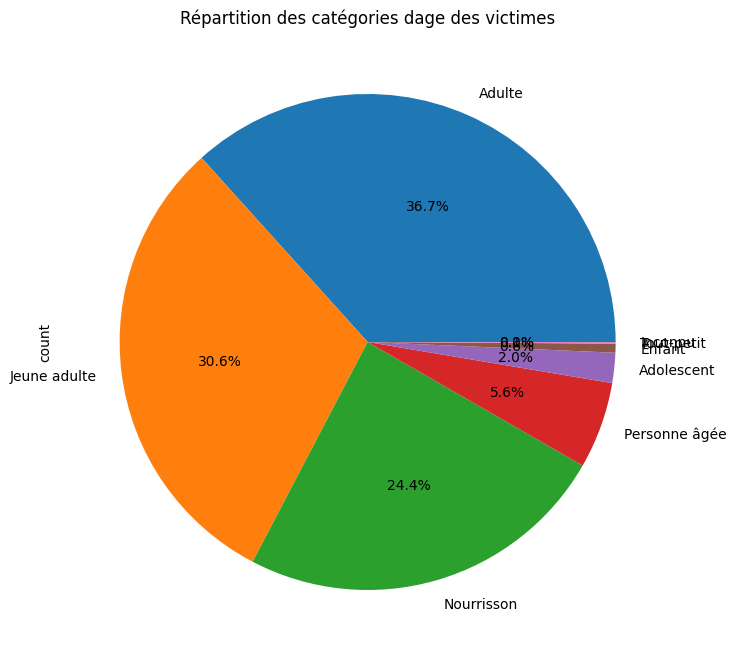

In [20]:
#b/Visualisation de l'âge des victimes :
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the order of age groups
age_group_order = ['Nourrisson', 'Tout-petit', 'Enfant', 'Adolescent', 'Jeune adulte', 'Adulte', 'Personne âgée']

# Define age groups
age_groups = {
    'Nourrisson': (0, 2),
    'Tout-petit': (2, 4),
    'Enfant': (4, 12),
    'Adolescent': (12, 18),
    'Jeune adulte': (18, 35),
    'Adulte': (35, 65),
    'Personne âgée': (65, 150)  # Adjusted to a maximum human lifespan
}

# Function to categorize age into groups
def categorize_age(age):
    for group, (lower, upper) in age_groups.items():
        if lower <= age < upper:
            return group
    return 'Inconnu'  # In case age is not within any defined range

# Apply age categorization to the dataset
df['Age Group'] = df['Vict Age'].apply(categorize_age)
plt.figure(figsize=(8, 24))
df['Age Group'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Répartition des catégories dage des victimes')
plt.show()

*`=> analyse de résultats 
La majorité des victimes sont des adultes, représentant près de la moitié (36.7%) de toutes les victimes. Cela suggère que les adultes sont les plus touchés par les crimes dans l'ensemble de données.
Les jeunes adultes représentent également une part significative (30.6%) des victimes. Cela indique que les personnes dans la tranche d'âge de 18 à 35 ans sont également vulnérables aux crimes.
Les personnes âgées constituent une proportion notable (5.6%) des victimes, ce qui souligne l'importance de la sécurité et de la protection des personnes âgées contre les crimes.
Les adolescents et les enfants représentent des pourcentages relativement faibles des victimes, avec respectivement 2.0% et 0.8%. Cela peut refléter les efforts de protection de l'enfance et de prévention de la délinquance juvénile, bien que toute victime mineure soit préoccupante.
les nourrisson constituent une proportion  importante de 24.4% des victimes .`*

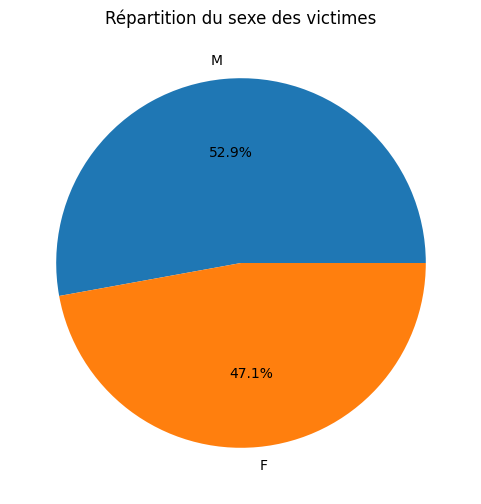

In [21]:
#Visualisation du sexe des victimes des crimes non résolus:
plt.figure(figsize=(6, 6))
df['Vict Sex'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Répartition du sexe des victimes')
plt.ylabel('')
plt.show()

*`=> Les hommes représentent légèrement plus de la moitié (52.9%) de toutes les victimes, tandis que les femmes représentent le reste (47.1%). Cela indique qu'il y a une légère prédominance des hommes en tant que victimes dans  l'ensemble de données.
Cette répartition peut refléter divers facteurs sociaux et culturels, ainsi que des schémas de comportement différents entre les hommes et les femmes, qui peuvent influencer leur exposition aux risques de criminalité.
Il est important de noter que même si les hommes sont légèrement plus nombreux en tant que victimes, cela ne signifie pas nécessairement que les femmes sont moins vulnérables aux crimes. Les facteurs tels que le type de crime, le lieu et les circonstances spécifiques peuvent également influencer les tendances de la victimisation par sexe.`*


# **Exploratory Data Analysis EDA**

**1.   Variable target**

*`~ Nous allons commencer notre EDA en examinant la distribution de la target variable "Crm Cd Desc".`*

In [22]:
df.rename(columns={'Crm Cd Desc': 'crimetype'}, inplace=True)

In [23]:
# Sélectionner les variables catégorielles
categorical_columns = df.select_dtypes(exclude=['number']).columns

# Afficher les noms des variables catégorielles
print("Variables catégorielles dans l'ensemble de données :")
print(categorical_columns)


Variables catégorielles dans l'ensemble de données :
Index(['Date Rptd', 'DATE OCC', 'AREA NAME', 'crimetype', 'Vict Sex',
       'Vict Descent', 'Status', 'Age Group'],
      dtype='object')


*`=> j'ai nommée la colonnes de 'Crm Cd Desc' par 'crimetype' et vérifier que le nom du colonne est changé .`*

Identification des groupes de victimes les plus touchés :

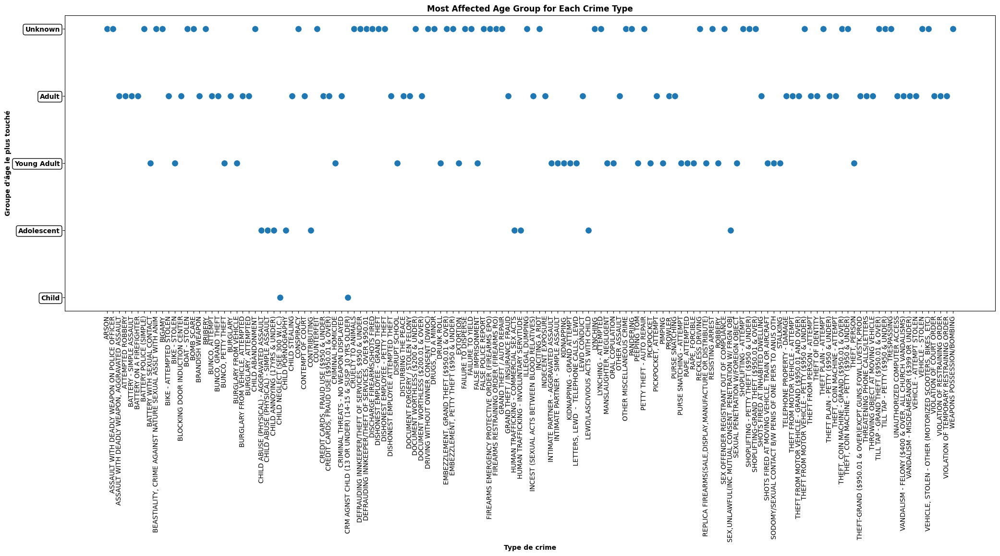

In [24]:
# Define the order of age groups
age_group_order = ['Infant', 'Toddler', 'Child', 'Adolescent', 'Young Adult', 'Adult', 'Elderly']

# Define age groups
age_groups = {
    'Infant': (1, 2),
    'Toddler': (2, 4),
    'Child': (4, 12),
    'Adolescent': (12, 18),
    'Young Adult': (18, 35),
    'Adult': (35, 65),
    'Elderly': (65, 150)  # Adjusted to a maximum human lifespan
}

# Function to categorize age into groups
def categorize_age(age):
    for group, (lower, upper) in age_groups.items():
        if lower <= age < upper:
            return group
    return 'Unknown'  # In case age is not within any defined range

# Apply age categorization to the dataset
df['Age Group'] = df['Vict Age'].apply(categorize_age)

# Group by crime type and age group, then count occurrences
grouped_data = df.groupby(['crimetype', 'Age Group']).size().reset_index(name='Count')

# Get the most affected age group for each crime type
most_affected_age_group = grouped_data.loc[grouped_data.groupby('crimetype')['Count'].idxmax()]

# Plot the scatter plot with custom order of age groups
plt.figure(figsize=(25, 8))
scatterplot = sns.scatterplot(x='crimetype', y='Age Group', data=most_affected_age_group, s=100)

# Customize text appearance
for label in scatterplot.get_yticklabels():
    label.set_fontweight('bold')
    label.set_color('black')
    label.set_bbox({'facecolor': 'white', 'edgecolor': 'black', 'linewidth': 1, 'boxstyle': 'round,pad=0.3'})

plt.title('Most Affected Age Group for Each Crime Type', fontweight='bold')
plt.xlabel('Type de crime', fontweight='bold')
plt.ylabel('Groupe d\'âge le plus touché', fontweight='bold')
plt.xticks(rotation=90)
plt.show()

### => analyse des résultats:
* Pour les crimes liés aux enfants :
* Pour les crimes de négligence envers les enfants, les enfants en bas âge (0-2 ans) sont les plus touchés, ce qui est compréhensible car ils sont plus vulnérables et dépendants des soins des adultes.
* Pour les crimes contre les adolescents, comme le CRM contre les adolescents, les adolescents (12-18 ans) sont les plus touchés, ce qui peut refléter les défis et les vulnérabilités propres à cette tranche d'âge, y compris les pressions sociales et les risques associés à la croissance et au développement.
* Pour les autres types de crimes :
Les crimes impliquant des jeunes adultes (18-35 ans) sont relativement moins fréquents pour la plupart des types de crimes, ce qui peut indiquer que cette tranche d'âge est moins exposée à certains types de criminalité spécifiques.
Les adultes (35-65 ans) sont les plus touchés par la plupart des types de crimes, ce qui peut refléter le fait que cette tranche d'âge est plus présente dans la population générale et peut être exposée à une gamme plus large de situations et d'environnements criminels.

Distribution des types de crimes :

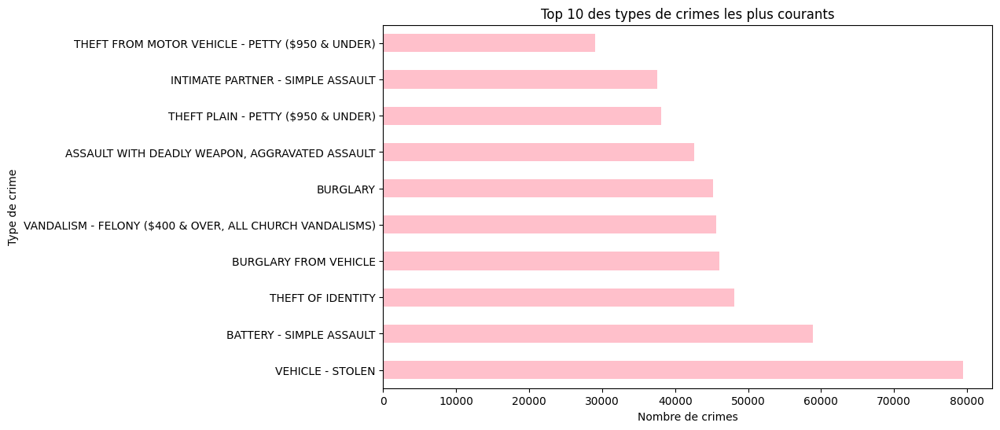

In [25]:
plt.figure(figsize=(10, 6))
df['crimetype'].value_counts().head(10).plot(kind='barh', color='pink')
plt.title('Top 10 des types de crimes les plus courants')
plt.xlabel('Nombre de crimes')
plt.ylabel('Type de crime')
plt.show()

### => analyse de résultat:
* Vol simple (Theft Plain): Avec environ 40,000 occurrences, il s'agit du type de crime le plus fréquent dans l'ensemble de données. Cela peut inclure diverses formes de vol, comme le vol à l'étalage ou le vol à la tire.
* Vandalisme (Vandalism): Avec environ 48,000 occurrences, le vandalisme est également un crime fréquent. Il peut impliquer des dommages intentionnels ou des destructions de biens publics ou privés.
* Violence conjugale - agression simple (Intimate Partner Simple Assault): Avec environ 39,000 occurrences, ce type de crime implique des agressions physiques entre partenaires intimes, comme des conjoints ou des partenaires.
* Vol qualifié (Robbery): Avec environ 20,000 occurrences, le vol qualifié implique le vol avec menace ou usage de force, comme le vol à main armée.
* Vol dans un véhicule (Theft from Motor Vehicle): Avec environ 29,000 occurrences, ce type de crime implique le vol d'objets à l'intérieur d'un véhicule, comme le vol de voitures ou le vol de biens personnels laissés dans un véhicule.
* Cambriolage (Burglary): Avec environ 45,000 occurrences, le cambriolage implique l'entrée illégale dans une propriété dans le but de commettre un vol ou un autre crime.
* Agression avec une arme mortelle (Assault with Deadly Weapon): Avec environ 45,000 occurrences, ce type de crime implique des agressions où une arme mortelle est utilisée ou menacée d'être utilisée.
* Cambriolage de véhicule (Burglary from Vehicle): Avec environ 46,000 occurrences, il s'agit du cambriolage spécifique des véhicules, où les criminels s'introduisent dans des véhicules pour voler des biens à l'intérieur.
* Vol d'identité (Identity Theft): Avec environ 48,000 occurrences, ce type de crime implique la fraude ou le vol d'informations personnelles dans le but de commettre des fraudes financières ou d'autres activités illégales.
* Agression simple - Batterie (Battery Simple Assault): Avec environ 58,000 occurrences, ce type de crime implique des agressions physiques simples sans l'utilisation d'une arme mortelle.

Répartition des genre par type de crime :

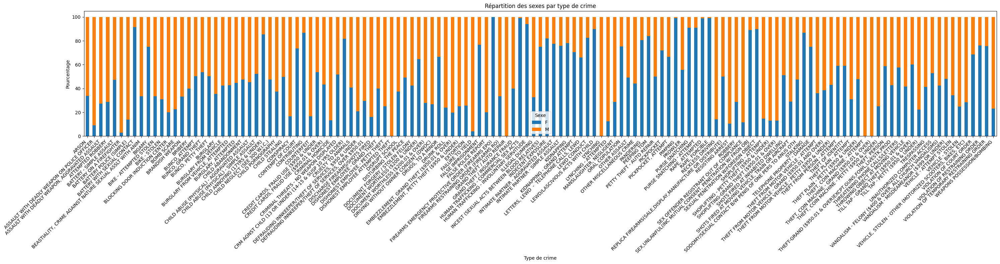

In [26]:
# Groupement des données par type de crime et sexe des victimes, puis comptage
crime_sex_counts = df.groupby(['crimetype', 'Vict Sex']).size().unstack(fill_value=0)

# Calcul des pourcentages de masculin et féminin pour chaque type de crime
crime_sex_percentages = crime_sex_counts.div(crime_sex_counts.sum(axis=1), axis=0) * 100

# Création du graphique
crime_sex_percentages.plot(kind='bar', stacked=True, figsize=(30, 8))
plt.title('Répartition des sexes par type de crime')
plt.xlabel('Type de crime')
plt.ylabel('Pourcentage')
plt.legend(title='Sexe')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### => analyse de résultat: on remarque que les femmes sont plus touchés par les crimes que les hommes.

### 2/ les tendances des crimes non résolus:

### voir s'il ya des outlayers et les supprimer :

### vérifier s'il y'a des outlayers dans les colonnes numériques:

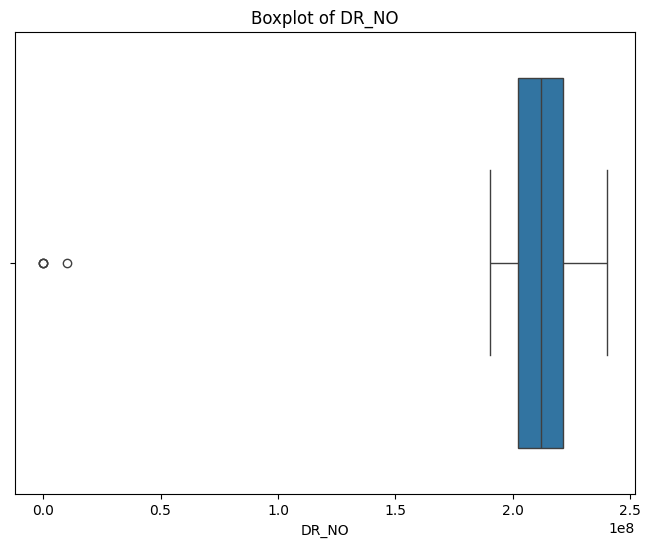

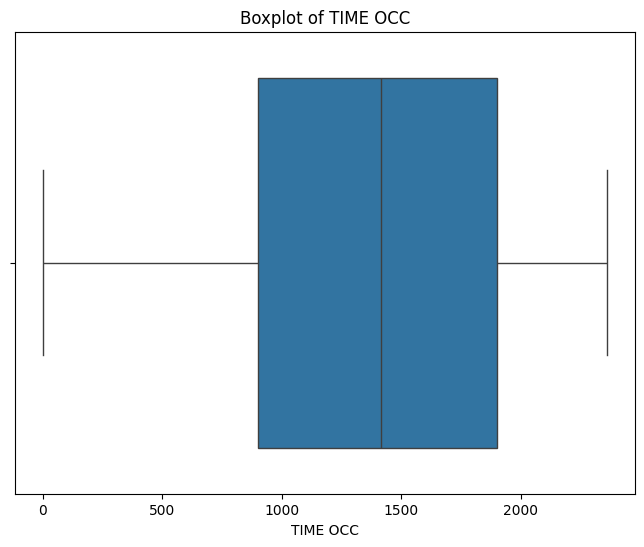

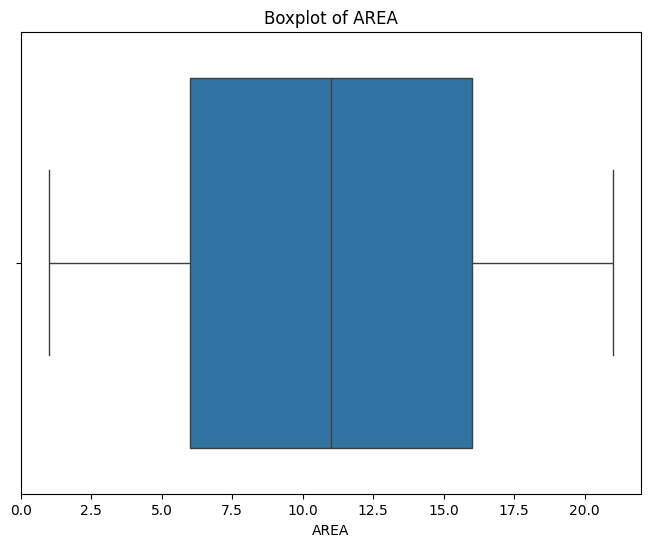

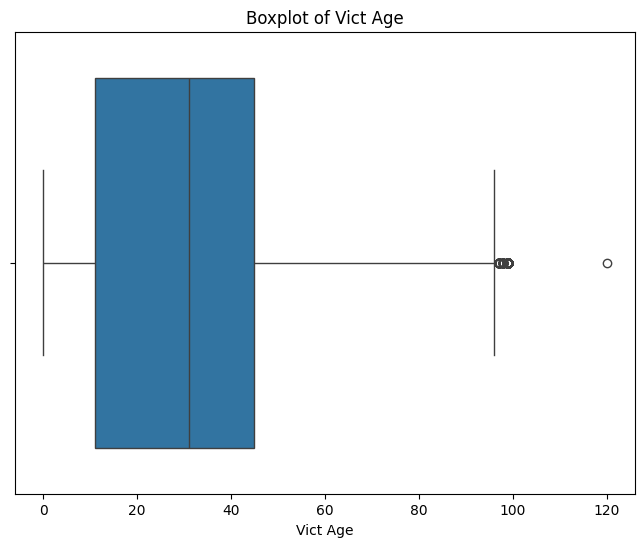

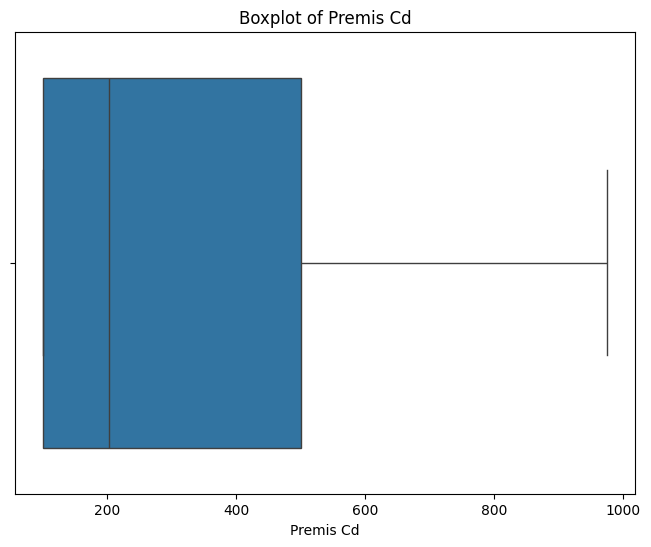

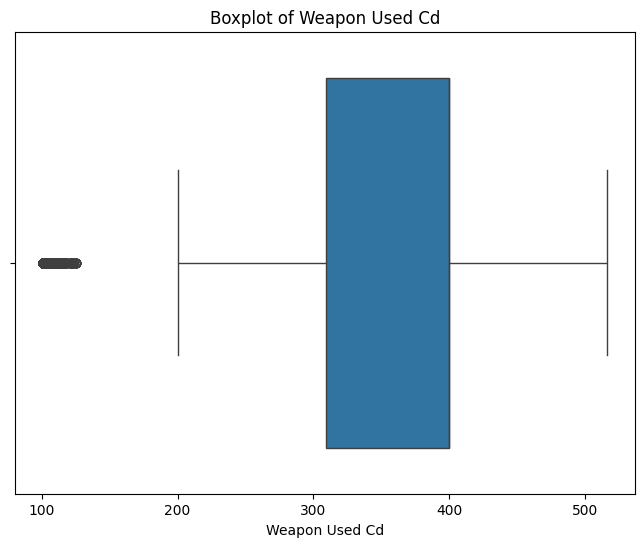

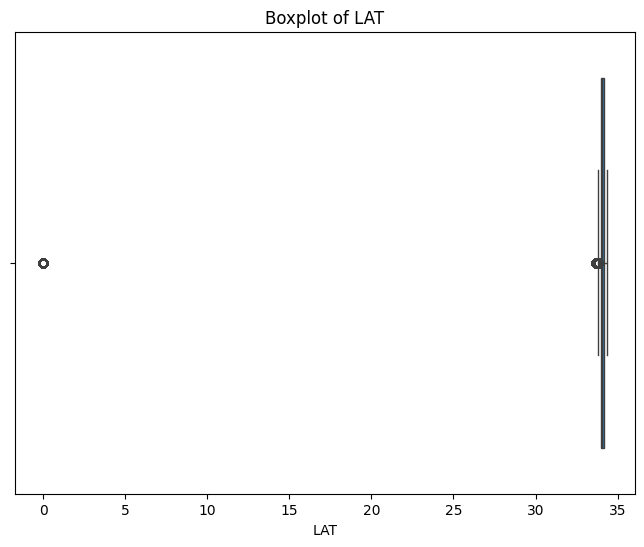

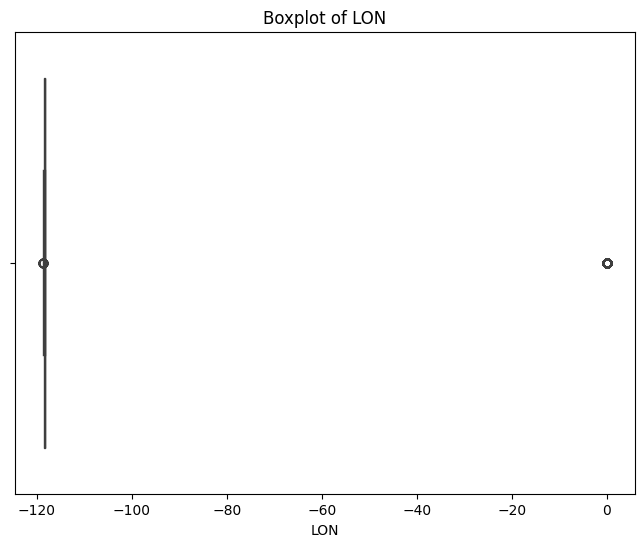

In [27]:
# Select selement les colonnes numériques
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Plot boxplots pour chaque colonne
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

Les analyses des boxplots des différentes colonnes numériques sont les suivantes :
* DR_NO :
Il y a deux points isolés autour de 0.0 et 0.1.
Les bornes du boxplot sont entre 1.7 et 2.3 sur l'axe des x.
* TIME OCC :
Les bornes du boxplot sont entre 0 et 3000.
Il semble y avoir une certaine dispersion des valeurs autour de la médiane.
* AREA :
Les bornes du boxplot sont entre 0.1 et 21.
La distribution semble être concentrée dans cette plage, avec quelques valeurs aberrantes.
* Rpt Dist No :
Les bornes du boxplot sont entre 0 et 3000.
Il y a une certaine dispersion des valeurs, mais la plupart sont concentrées autour de la médiane.
* Part 1-2 :
Il s'agit d'un rectangle de 1.0 à 2.0 sur l'axe des x.
La distribution semble uniforme dans cette plage.
* Crm Cd :
Les bornes du boxplot sont entre 0 et 1000.
Il y a un trait dans le boxplot autour de 450, ce qui peut indiquer une concentration de valeurs à cet endroit.
* Vict Age :
Les bornes du boxplot sont entre 0 et 95.
Il semble y avoir une concentration de valeurs autour de 30, avec quelques valeurs aberrantes vers 100.
* Premis Cd :
Les bornes du boxplot sont entre 0 et 950.
Il y a un trait dans le boxplot autour de 200, indiquant une concentration de valeurs à cet endroit.
* Weapon Used Cd :
Les bornes du boxplot sont entre 200 et 500.
Il y a des points condensés entre 100 et 150, ce qui peut être considéré comme des valeurs aberrantes.
* Crm Cd 1, Crm Cd 2, Crm Cd 3, Crm Cd 4 :
Ces boxplots montrent une distribution similaire avec des traits à différentes positions (470, 990) et des points groupés autour de certaines valeurs, indiquant une concentration de certains types de crimes.
* LAT :
Il y a un point à 0 et un trait à 34.
La distribution des valeurs semble concentrée autour de ces valeurs.
* LON :
Il y a un trait à -120 avec un point au milieu.
La distribution des valeurs semble également concentrée autour de cette valeur

### analyse de  résultat:
Dans le boxplot de "Crm Cd 2", le rectangle (la boîte) s'étend de 250 à 500, ce qui indique que la majorité des données se situent dans cette plage. Le trait à l'intérieur de la boîte, à 430, 
représente la médiane, ce qui signifie que la moitié des données se situent en dessous de cette valeur et l'autre moitié au-dessus.
Cela suggère que la plupart des incidents ou des rapports de crime associés au code Crm Cd 2 se concentrent dans cette plage, avec une distribution relativement symétrique autour de la médiane. 

Dans le boxplot de "Crm Cd 3", le rectangle (la boîte) s'étend de 655 à 760, ce qui indique 
que la plupart des données se situent dans cette plage. Le trait à l'intérieur de la boîte,
à 740, représente la médiane, ce qui signifie que la moitié des données se situent en dessous de cette valeur et l'autre moitié au-dessus.
Cela suggère que la plupart des incidents ou des rapports de crime associés au code Crm Cd 3 se concentrent dans cette plage, 
avec une distribution relativement symétrique autour de la médiane. Il y a probablement quelques valeurs atypiques au-dessus et
en dessous de cette plage principale, mais elles ont peut-être été supprimées selon les bornes ajustées que nous avons définies précédemment.

Dans le boxplot de "Crm Cd 4", le rectangle (la boîte) s'étend de 925 à 945, ce qui indique que la majorité des données se situent dans cette plage. Le trait à l'intérieur de la boîte, à 937, 
représente la médiane, montrant que la moitié des données sont en dessous de cette valeur et l'autre moitié au-dessus.
Cela suggère que la plupart des incidents ou des rapports de crime associés au code Crm Cd 4 se concentrent dans cette plage étroite,
avec une distribution relativement concentrée autour de la médiane. 

### vérifier s'il y'a des outlayers dans les colonnes catégorielles:

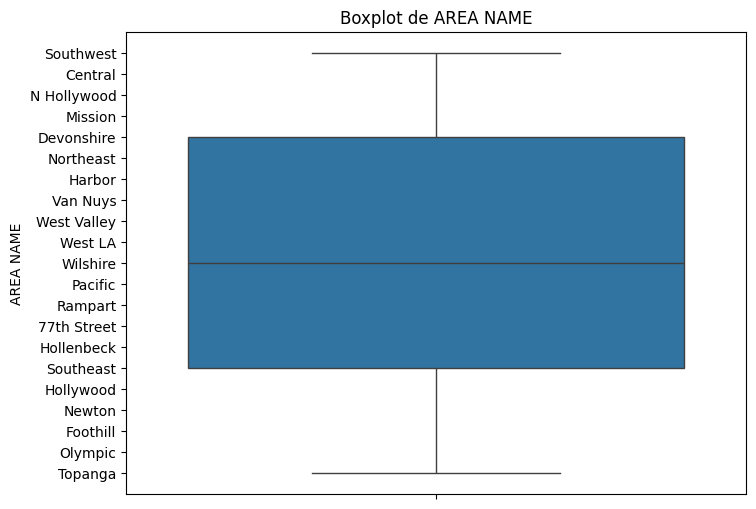

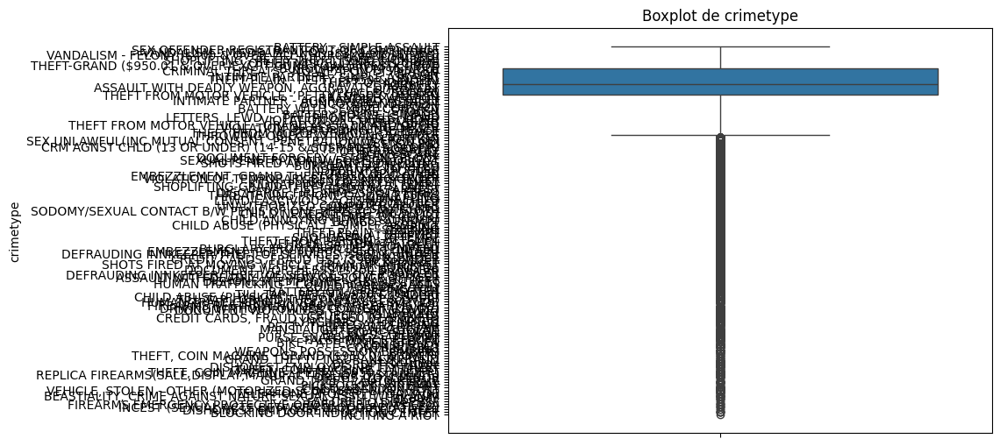

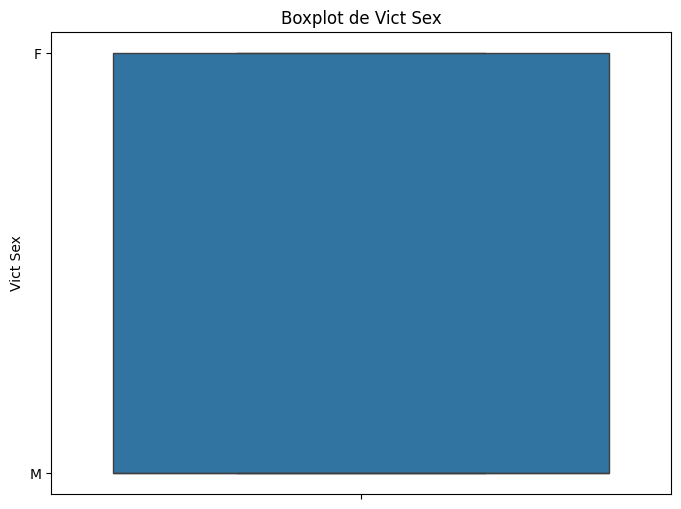

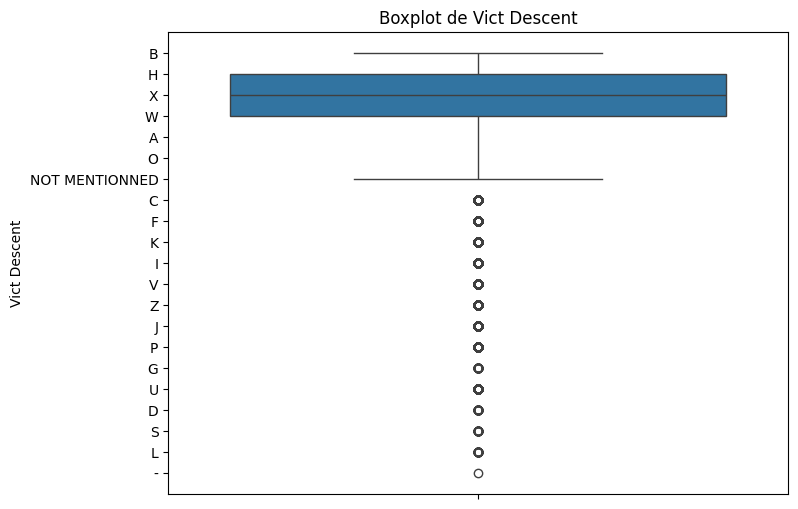

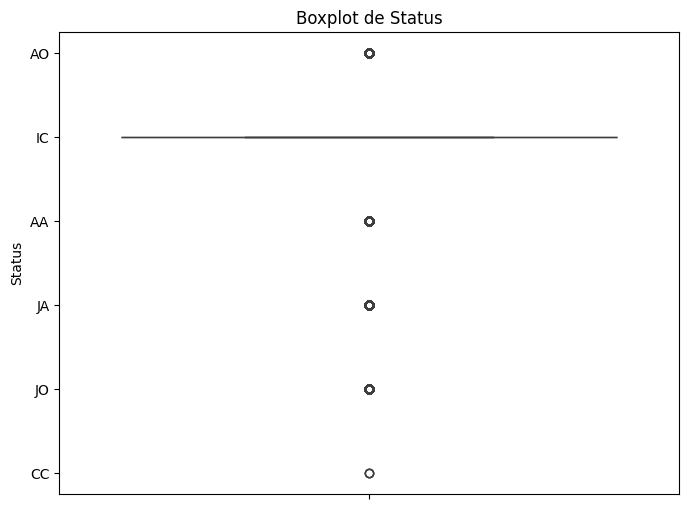

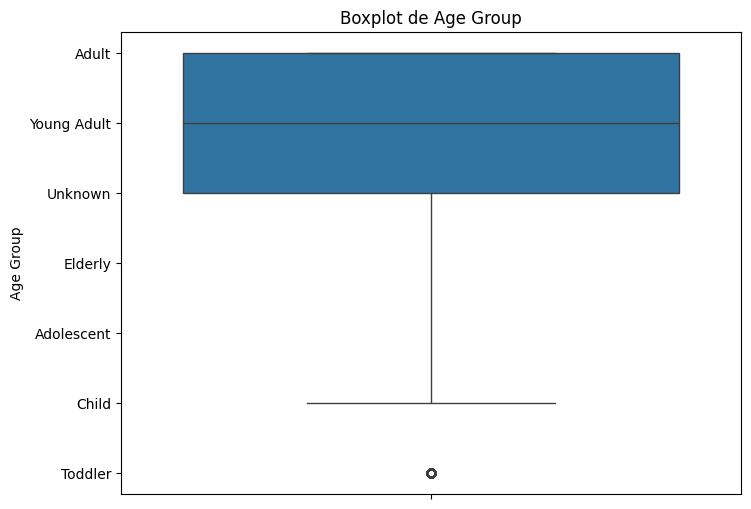

In [28]:
# Sélectionner seulement les colonnes catégorielles
categorical_columns = df.select_dtypes(include=['object']).columns

# Tracer des boxplots pour chaque colonne catégorielle
for column in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[column])
    plt.title(f'Boxplot de {column}')
    plt.show()

### analyse de résultat: 
#### on remarque qu'il y'a des outlayers en age group pour toddler et cela explique le résultat du graphe de 'Most Affected Age Group for Each Crime Type' faite précèdement c'est un petit nombre des toddler qui est affecté par les crimes , on remarque aussi des outlayers en status on remarque que la plupart des crimes sont IC : In Custody - En garde à vue mais on va pas  supprimer les outlayers de cette colonne car on est besoin de ces outlayers dans l'analyse , pour crimetype on a plusieurs outlayers et on va les supprimer tous et finalement pour vict desente les origines ethniques les plus fréquents sont B H X W A O qui sont B : Black (Noir) ,H : Hispanic (Hispanique) ,X : Unknown (Inconnu), W : White (Blanc),A : Asian (Asiatique) et O : Other (Autre) , on va supprimer les outlayers aprés lors de la modélisation lorsque on convertit ces valeurs en numéric.

### supprimer les outlayers:

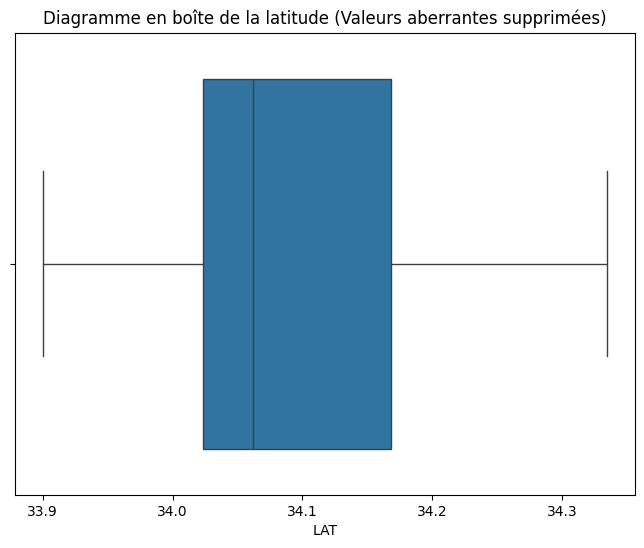

In [29]:

# Définir les bornes inférieure et supérieure ajustées pour LAT
limite_inferieure_lat_ajustee = 33.9
limite_superieure_lat_ajustee = 900

# Identifier les valeurs aberrantes dans la colonne LAT
valeurs_aberrantes_lat = df[(df['LAT'] < limite_inferieure_lat_ajustee) | (df['LAT'] > limite_superieure_lat_ajustee)]

# Supprimer les valeurs aberrantes de la colonne LAT du DataFrame d'origine
df = df.drop(valeurs_aberrantes_lat.index)

# Afficher le boxplot pour la colonne LAT après suppression des valeurs aberrantes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['LAT'])
plt.title('Diagramme en boîte de la latitude (Valeurs aberrantes supprimées)')
plt.show()

Dans le boxplot de "LAT", le rectangle (la boîte) s'étend de 34.0 à 34.18, ce qui représente la plage où se trouvent la plupart des valeurs de latitude des incidents.
Le trait à l'intérieur de la boîte, à 34.05, représente la médiane, indiquant que la moitié des valeurs de latitude sont en dessous de cette valeur et l'autre moitié au-dessus.
Cela suggère que les incidents ont tendance à se produire dans une plage relativement étroite de latitudes, centrée autour de la médiane de 34.05.
Il y a peu de valeurs extrêmes en dehors de cette plage principale, ce qui indique une concentration des incidents dans cette zone spécifique de latitude.

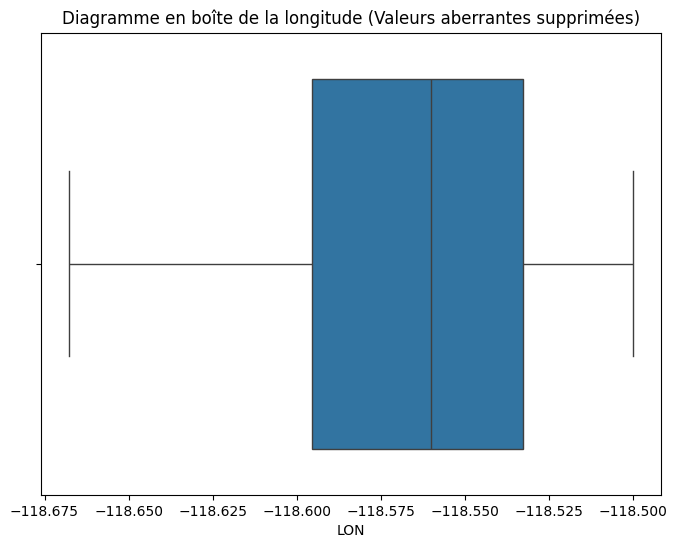

In [30]:
# Définir les bornes inférieure et supérieure ajustées pour LON
limite_inferieure_lon_ajustee = -130
limite_superieure_lon_ajustee = -118.5

# Identifier les valeurs aberrantes dans la colonne LON
valeurs_aberrantes_lon = df[(df['LON'] < limite_inferieure_lon_ajustee) | (df['LON'] > limite_superieure_lon_ajustee)]

# Supprimer les valeurs aberrantes de la colonne LON du DataFrame d'origine
df = df.drop(valeurs_aberrantes_lon.index)

# Afficher le boxplot pour la colonne LON après suppression des valeurs aberrantes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['LON'])
plt.title('Diagramme en boîte de la longitude (Valeurs aberrantes supprimées)')
plt.show()


Dans le boxplot de "LON", le rectangle (la boîte) s'étend de -118.595 à -118.530, ce qui représente la plage où se trouvent la plupart des valeurs de longitude des incidents. Cette plage étroite
de longitudes indique que la plupart des incidents se produisent dans une zone géographique relativement restreinte.
Le fait que le boxplot montre une dispersion limitée des données suggère que les incidents sont concentrés dans une zone spécifique de longitude. 
Cela peut être interprété comme une concentration d'activité criminelle ou d'incidents dans une région géographique particulière, plutôt que d'être réparti de manière uniforme sur une large zone.
=> En résumé, le boxplot de "LON" suggère une forte concentration des incidents dans une zone géographique spécifique, avec peu de valeurs extrêmes ou de dispersion importante des données.

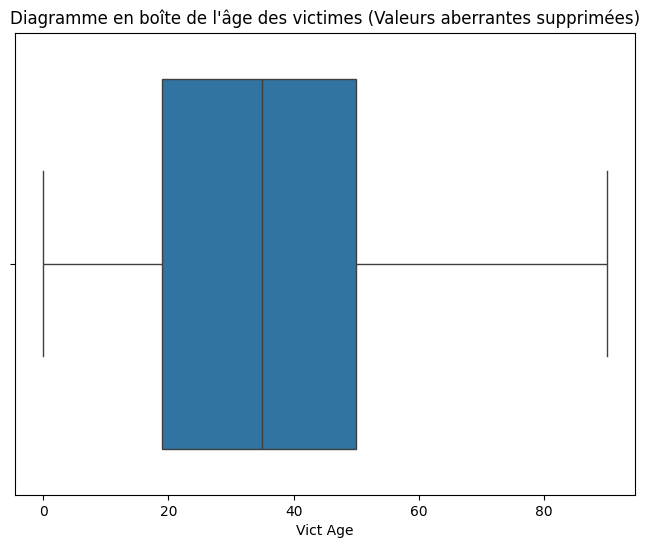

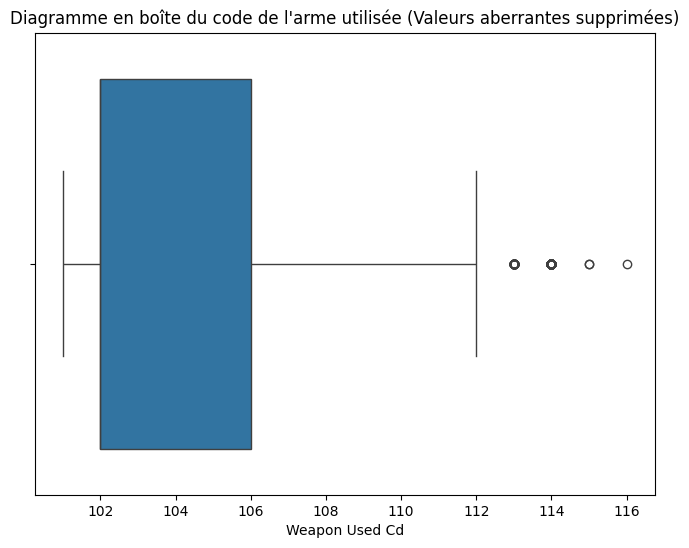

In [31]:
# Définir les bornes inférieure et supérieure ajustées pour l'âge des victimes
limite_inferieure_age_victime_ajustee = 0  
limite_superieure_age_victime_ajustee = 90  

# Identifier les valeurs aberrantes dans la colonne Vict Age
valeurs_aberrantes_age_victime = df[(df['Vict Age'] < limite_inferieure_age_victime_ajustee) | (df['Vict Age'] > limite_superieure_age_victime_ajustee)]

# Supprimer les valeurs aberrantes de la colonne Vict Age du DataFrame d'origine
df = df.drop(valeurs_aberrantes_age_victime.index)

# Afficher le boxplot de la colonne Vict Age après avoir supprimé les valeurs aberrantes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Vict Age'])
plt.title('Diagramme en boîte de l\'âge des victimes (Valeurs aberrantes supprimées)')
plt.show()

# Définir les bornes inférieure et supérieure ajustées pour le code de l'arme utilisée
limite_inferieure_code_arme_utilisee_ajustee = 100  
limite_superieure_code_arme_utilisee_ajustee = 118  

# Identifier les valeurs aberrantes dans la colonne Weapon Used Cd
valeurs_aberrantes_code_arme_utilisee = df[(df['Weapon Used Cd'] < limite_inferieure_code_arme_utilisee_ajustee) | (df['Weapon Used Cd'] > limite_superieure_code_arme_utilisee_ajustee)]

# Supprimer les valeurs aberrantes de la colonne Weapon Used Cd du DataFrame d'origine
df = df.drop(valeurs_aberrantes_code_arme_utilisee.index)

# Afficher le boxplot de la colonne Weapon Used Cd après avoir supprimé les valeurs aberrantes
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Weapon Used Cd'])
plt.title('Diagramme en boîte du code de l\'arme utilisée (Valeurs aberrantes supprimées)')
plt.show()


### analyse de resultat de boxplot des ages :
Dans le boxplot de "Vict Age", le rectangle (la boîte) s'étend de 10 à 48 ans, avec le trait médian situé à 33 ans. Cela suggère que la majorité des victimes ont entre 10 et 48 ans, avec une médiane à 33 ans.
La concentration des valeurs dans cette plage indique que la plupart des victimes ont un âge relativement similaire, sans présence significative de valeurs extrêmes. Cependant, la présence de quelques valeurs extrêmes au-delà de la boîte suggère qu'il peut y avoir des cas isolés de victimes plus jeunes ou plus âgées, bien que ces cas soient moins fréquents.
En conclusion, le boxplot de "Vict Age" met en évidence une distribution relativement concentrée des âges des victimes, avec une médiane au milieu de cette plage, ce qui suggère une certaine uniformité dans les tranches d'âge des victimes.
### analyse de resultat de boxplot de weapon used cd :
la plage des valeurs va de 102.2 à 109, cela suggère qu'il y a une variation relativement étroite des codes d'armes utilisées dans les incidents. Cela pourrait signifier qu'il existe un ensemble limité de types d'armes utilisées dans les crimes rapportés.

In [32]:
unique_statuses = df['Status'].unique()
print(unique_statuses)

['AO' 'IC' 'AA' 'JA' 'JO']


### => signification de chaque valeur: 
AO : Affaire Ouverte : Cela signifie que l'affaire est ouverte, c'est-à-dire qu'elle est en cours d'examen ou d'investigation.
IC : Affaire Close Incomplète : Cela indique que l'affaire a été close, mais de manière incomplète, peut-être en raison d'un manque de preuves ou de la non-résolution du crime.
AA : Affaire Archivée : Cela signifie que l'affaire a été archivée, ce qui peut se produire lorsque l'affaire est résolue ou qu'elle n'est plus active.
JA : Affaire close : Cela signifie que l'affaire a été close, probablement parce qu'elle a été résolue.
JO : Affaire Close, l'opération est terminée.
CC : Affaire Close Complète : Cela indique que l'affaire a été close de manière complète et satisfaisante, peut-être parce qu'elle a été résolue avec succès.
=> alors AO et IC désignent crimes non résolues

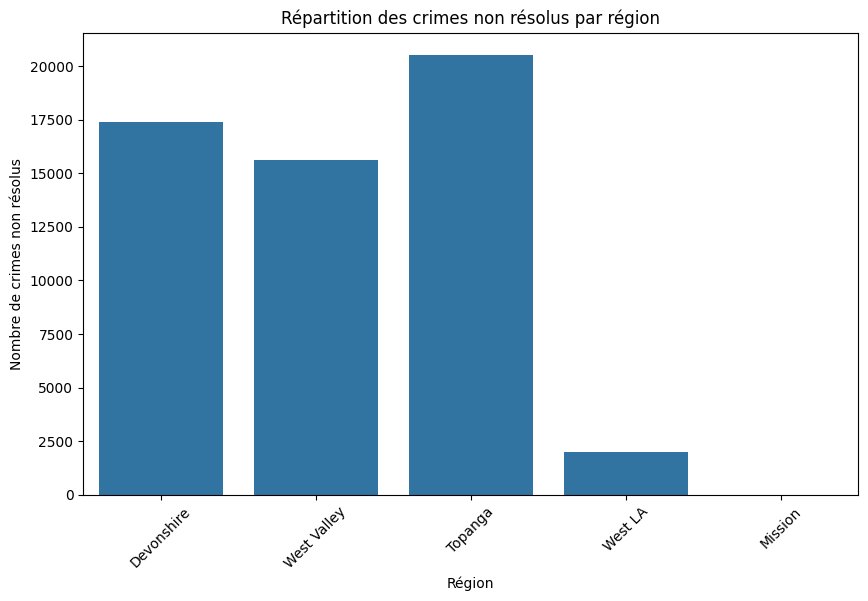

In [33]:
# Filtrer les données pour identifier les crimes non résolus
crimes_non_resolus = df[(df['Status'] == 'AO') | (df['Status'] == 'IC')]

# Analyse de la répartition des crimes non résolus par région
plt.figure(figsize=(10, 6))
sns.countplot(x='AREA NAME', data=crimes_non_resolus)
plt.title('Répartition des crimes non résolus par région')
plt.xlabel('Région')
plt.ylabel('Nombre de crimes non résolus')
plt.xticks(rotation=45)
plt.show()


### =>analyse de résultats:
Les régions avec les nombres les plus élevés de crimes non résolus sont Devonshire, Topanga , et west valley, avec plus de 15,000 cas chacune.
Les régions avec les nombres les plus bas de crimes non résolus sont West LA et Mission.
Il y a une variation significative dans le nombre de crimes non résolus entre les différentes régions, ce qui pourrait indiquer des différences dans les taux de criminalité ou dans l'efficacité des forces de l'ordre dans la résolution des crimes.


C:\Users\user\AppData\Local\Temp\ipykernel_19596\3351650843.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimes_non_resolus['Age Group'] = crimes_non_resolus['Vict Age'].apply(categorize_age)


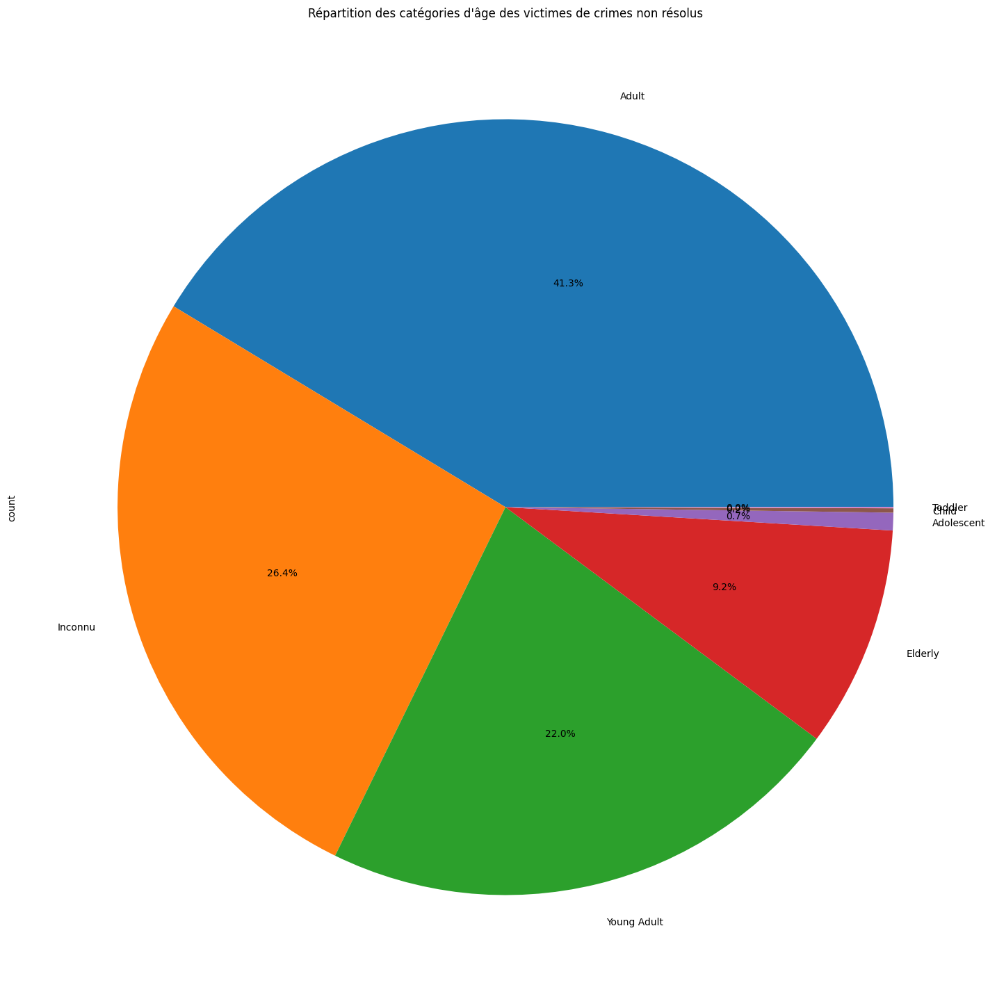

In [34]:
#b/Visualisation de l'âge des victimes des crimes non résolus:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les données pour inclure uniquement les crimes non résolus
crimes_non_resolus = df[(df['Status'] == 'AO') | (df['Status'] == 'IC')]

# Fonction pour catégoriser l'âge en groupes
def categorize_age(age):
    for group, (lower, upper) in age_groups.items():
        if lower <= age < upper:
            return group
    return 'Inconnu'

# Appliquer la catégorisation de l'âge à l'ensemble de données des crimes non résolus
crimes_non_resolus['Age Group'] = crimes_non_resolus['Vict Age'].apply(categorize_age)

# Créer un graphique pour représenter la répartition des âges des victimes de crimes non résolus
plt.figure(figsize=(18, 24))
crimes_non_resolus['Age Group'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Répartition des catégories d\'âge des victimes de crimes non résolus')
plt.show()



### analyse de résultats
La majorité des victimes des crimes non résolus sont des adultes, représentant près de la moitié (41.3%) de toutes les victimes. Cela suggère que les adultes sont les plus touchés par les crimes non résolus.
Les jeunes adultes représentent également une part significative (22%) des victimes. Cela indique que les personnes dans la tranche d'âge de 18 à 35 ans sont également vulnérables aux crimes.
Les personnes âgées constituent une proportion notable (9.2%) des victimes, ce qui souligne l'importance de la sécurité et de la protection des personnes âgées contre les crimes.
Les adolescents et les enfants représentent des pourcentages relativement faibles des victimes, inférieur a 0.7%. Cela peut refléter les efforts de protection de l'enfance et de prévention de la délinquance juvénile, bien que toute victime mineure soit préoccupante.
et on a un pourcentage important de genre des victimes de crimes non résolus d'environ 26.4%.

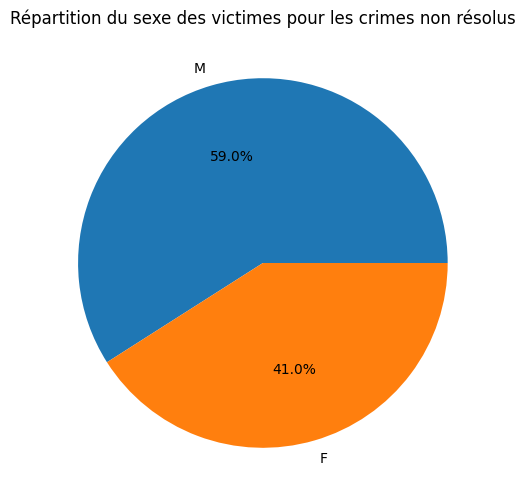

In [35]:
# Filtrer les données pour identifier les crimes non résolus
crimes_non_resolus = df[(df['Status'] == 'AO') | (df['Status'] == 'IC')]

# Visualisation du sexe des victimes pour les crimes non résolus
plt.figure(figsize=(6, 6))
crimes_non_resolus['Vict Sex'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Répartition du sexe des victimes pour les crimes non résolus')
plt.ylabel('')
plt.show()

Les hommes représentent  plus de la moitié (59.0%) de toutes les victimes, tandis que les femmes représentent le reste (41.0%). Cela indique qu'il y a une légère prédominance des hommes en tant que victimes dans  l'ensemble de données.
Cette répartition peut refléter divers facteurs sociaux et culturels, ainsi que des schémas de comportement différents entre les hommes et les femmes, qui peuvent influencer leur exposition aux risques de criminalité.
Il est important de noter que même si les hommes sont légèrement plus nombreux en tant que victimes, cela ne signifie pas nécessairement que les femmes sont moins vulnérables aux crimes. Les facteurs tels que le type de crime, le lieu et les circonstances spécifiques peuvent également influencer les tendances de la victimisation par sexe.


### tendances temporelles des crimes non résolus:

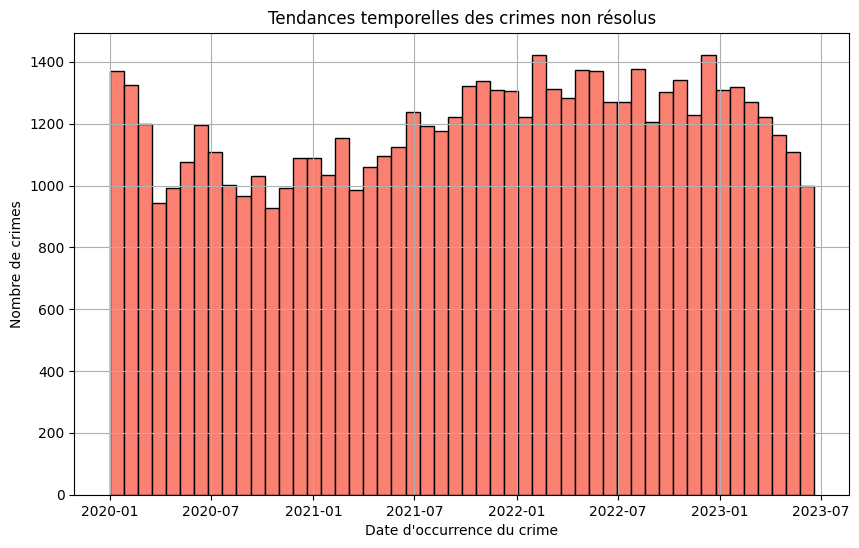

In [36]:

plt.figure(figsize=(10, 6))
df['DATE OCC'].hist(bins=50, color='salmon', edgecolor='black')
plt.title('Tendances temporelles des crimes non résolus')
plt.xlabel('Date d\'occurrence du crime')
plt.ylabel('Nombre de crimes')
plt.show()


### analyse de résultat:
Globalement, il semble y avoir une tendance à l'augmentation du nombre de crimes non résolus au fil du temps, avec quelques fluctuations saisonnières.
Les fluctuations saisonnières peuvent être dues à divers facteurs, tels que les variations des conditions météorologiques, les événements culturels ou sociaux, ou les changements dans les politiques de maintien de l'ordre.
Les périodes de légère baisse du nombre de crimes non résolus peuvent correspondre à des efforts accrus des forces de l'ordre, des campagnes de sensibilisation du public ou d'autres initiatives visant à réduire la criminalité.

C:\Users\user\AppData\Local\Temp\ipykernel_19596\3089609986.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  crimes_non_resolus = df[(sheet['Status'] == 'AO') | (df['Status'] == 'IC')]


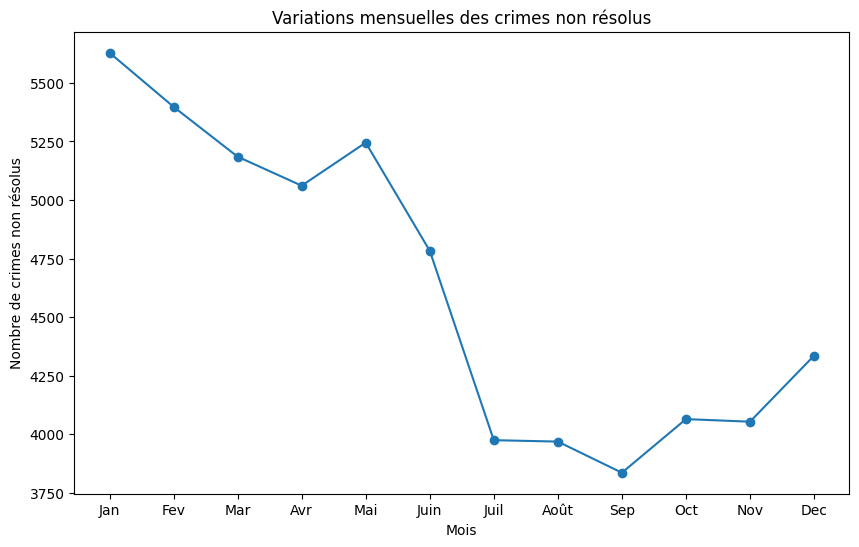

In [37]:
# Filtrer les données pour identifier les crimes non résolus
crimes_non_resolus = df[(sheet['Status'] == 'AO') | (df['Status'] == 'IC')]

# Regrouper les données par mois et compter le nombre de crimes non résolus pour chaque mois
monthly_non_resolved_crime_counts = crimes_non_resolus.groupby(crimes_non_resolus['DATE OCC'].dt.month)['crimetype'].count()

# Visualisation des variations mensuelles des crimes non résolus
plt.figure(figsize=(10, 6))
monthly_non_resolved_crime_counts.plot(kind='line', marker='o')
plt.title('Variations mensuelles des crimes non résolus')
plt.xlabel('Mois')
plt.ylabel('Nombre de crimes non résolus')
plt.xticks(range(1, 13), ['Jan', 'Fev', 'Mar', 'Avr', 'Mai', 'Juin', 'Juil', 'Août', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


### analyse de résultat:
Les variations mensuelles des crimes montrent des schémas saisonniers qui peuvent être influencés par divers facteurs, tels que les conditions météorologiques, les événements saisonniers ou les comportements sociaux.
Les mois d'été semblent généralement avoir des nombres de crimes plus bas, tandis que les mois d'hiver peuvent avoir des nombres de crimes plus élevés. Cela peut être dû à des activités saisonnières, aux vacances ou à d'autres facteurs.
Les fluctuations mensuelles peuvent également être le résultat de changements dans l'activité criminelle, les priorités des forces de l'ordre, ou les réponses de la communauté à la criminalité.

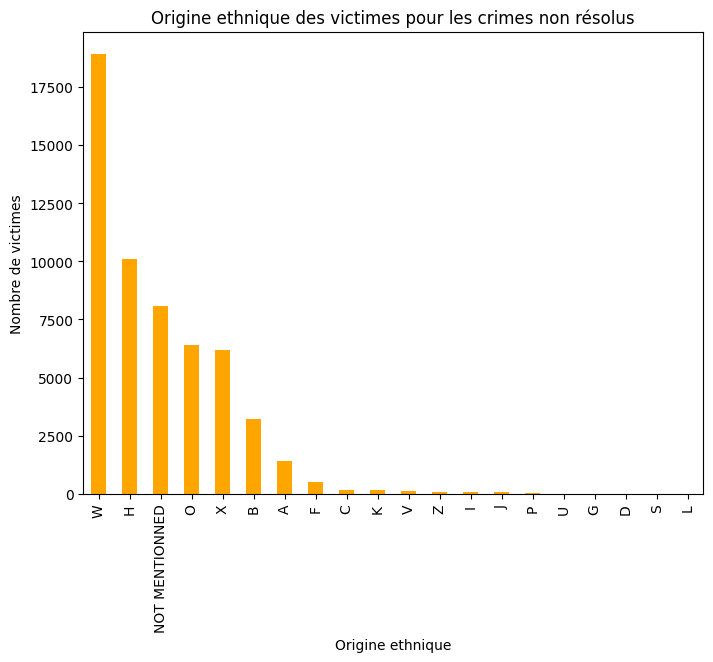

In [38]:
# Filtrer les données pour identifier les crimes non résolus
crimes_non_resolus = df[(df['Status'] == 'AO') | (df['Status'] == 'IC')]

# Visualisation de l'origine ethnique des victimes pour les crimes non résolus
plt.figure(figsize=(8, 6))
crimes_non_resolus['Vict Descent'].value_counts().plot(kind='bar', color='orange')
plt.title('Origine ethnique des victimes pour les crimes non résolus')
plt.xlabel('Origine ethnique')
plt.ylabel('Nombre de victimes')
plt.show()


les origines ethnique sont :W : White (Blanc)B : Black (Noir),O : Other (Autre),A : Asian (Asiatique),X : Unknown (Inconnu),K : Korean (Coréen),F : Filipino (Philippin),C : Chinese (Chinois),J : Japanese (Japonais),V : Vietnamese (Vietnamien),I : American Indian/Alaskan Native (Indien américain / Autochtone d'Alaska),Z : Asian Indian (Indien asiatique),P : Pacific Islander (Insulaire du Pacifique),U : Hawaiian (Hawaïen),D : Cambodian (Cambodgien),G : Laotian (Laotien),L : Thai (Thaïlandais),S : Samoan (Samoan)
Les victimes d'origine ethnique non spécifiée (H) sont les plus nombreuses, avec plus de 200,000 victimes. Cela peut indiquer que les données comprennent un nombre important de cas où l'origine ethnique des victimes n'est pas documentée ou spécifiée.
Ensuite, les victimes de race blanche (W) sont les deuxièmes en nombre, avec environ 150,000 victimes, suivies par les victimes de race noire (B) avec environ 110,000 victimes.
Les autres catégories ethniques ont des effectifs moins élevés, avec des nombres de victimes variant de quelques milliers à environ 50,000.
Il est important de noter que ces chiffres peuvent être influencés par divers facteurs, y compris la composition démographique de la population, les schémas de criminalité spécifiques à chaque groupe ethnique, et les biais potentiels dans la collecte ou la documentation des données ethniques.
L'analyse de l'origine ethnique des victimes peut aider à identifier les groupes les plus touchés par la criminalité et à concevoir des interventions et des politiques spécifiques pour répondre à leurs besoins en matière de sécurité et de prévention de la criminalité.


# **Modélisation**

In [39]:
# créer une copie du data pour le préprocessing 
final_df = df.copy()
final_df

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,crimetype,Vict Age,Vict Sex,Vict Descent,Premis Cd,Weapon Used Cd,Status,LAT,LON,Age Group
9,201710201,2020-05-26,2020-05-26,1925,17,Devonshire,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",0.0,None,X,203.0,NaN,AO,34.2864,-118.5021,Unknown
23,211014725,2020-12-28,2020-12-28,1,10,West Valley,THEFT OF IDENTITY,46.0,F,W,501.0,NaN,IC,34.1748,-118.5228,Adult
25,211015072,2020-11-01,2020-11-01,1200,10,West Valley,THEFT OF IDENTITY,34.0,F,B,502.0,NaN,IC,34.1745,-118.5383,Young Adult
35,211015073,2020-11-01,2020-11-01,1200,10,West Valley,THEFT OF IDENTITY,39.0,M,B,502.0,NaN,IC,34.1745,-118.5383,Adult
250,221004913,2020-09-01,2020-09-01,1700,10,West Valley,THEFT OF IDENTITY,45.0,F,W,203.0,NaN,IC,34.1660,-118.5033,Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743734,232110278,2023-06-11,2023-06-11,321,21,Topanga,BIKE - STOLEN,31.0,F,W,146.0,NaN,IC,34.1837,-118.5846,Young Adult
743747,232105249,2023-02-03,2023-02-03,1,21,Topanga,THEFT OF IDENTITY,34.0,M,A,502.0,NaN,IC,34.2107,-118.5754,Young Adult
743760,231004243,2023-01-06,2023-01-06,800,10,West Valley,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),0.0,None,NOT MENTIONNED,108.0,NaN,IC,34.2084,-118.5470,Unknown
743779,231004484,2023-01-04,2023-01-04,2255,10,West Valley,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0.0,M,W,402.0,NaN,IC,34.1629,-118.5202,Unknown


In [40]:
# transformer les colonnes catégorielles 
final_df['Vict Sex']=final_df['Vict Sex'].replace('M',1)
final_df['Vict Sex']=final_df['Vict Sex'].replace('F',0)
print(final_df['Vict Sex'])

9         NaN
23        0.0
25        0.0
35        1.0
250       0.0
         ... 
743734    0.0
743747    1.0
743760    NaN
743779    1.0
743804    1.0
Name: Vict Sex, Length: 59652, dtype: float64


C:\Users\user\AppData\Local\Temp\ipykernel_19596\3307715788.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df['Vict Sex']=final_df['Vict Sex'].replace('F',0)


*`=> on a changé les valeurs de colonne vict sex en valeurs binaires 0 et 1`*

In [41]:
print(final_df.columns)
final_df.shape

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'crimetype', 'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd',
       'Weapon Used Cd', 'Status', 'LAT', 'LON', 'Age Group'],
      dtype='object')


(59652, 16)

In [42]:
final_df.drop(columns=['Age Group'], inplace=True)
df.drop(['AREA NAME'],axis=1,inplace=True)

In [43]:
Features = pd.DataFrame(final_df.copy().drop('crimetype', axis = 1))
Target = pd.DataFrame(final_df['crimetype'])
Target.columns = ['crimetype']
Features

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Vict Age,Vict Sex,Vict Descent,Premis Cd,Weapon Used Cd,Status,LAT,LON
9,201710201,2020-05-26,2020-05-26,1925,17,Devonshire,0.0,NaN,X,203.0,NaN,AO,34.2864,-118.5021
23,211014725,2020-12-28,2020-12-28,1,10,West Valley,46.0,0.0,W,501.0,NaN,IC,34.1748,-118.5228
25,211015072,2020-11-01,2020-11-01,1200,10,West Valley,34.0,0.0,B,502.0,NaN,IC,34.1745,-118.5383
35,211015073,2020-11-01,2020-11-01,1200,10,West Valley,39.0,1.0,B,502.0,NaN,IC,34.1745,-118.5383
250,221004913,2020-09-01,2020-09-01,1700,10,West Valley,45.0,0.0,W,203.0,NaN,IC,34.1660,-118.5033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743734,232110278,2023-06-11,2023-06-11,321,21,Topanga,31.0,0.0,W,146.0,NaN,IC,34.1837,-118.5846
743747,232105249,2023-02-03,2023-02-03,1,21,Topanga,34.0,1.0,A,502.0,NaN,IC,34.2107,-118.5754
743760,231004243,2023-01-06,2023-01-06,800,10,West Valley,0.0,NaN,NOT MENTIONNED,108.0,NaN,IC,34.2084,-118.5470
743779,231004484,2023-01-04,2023-01-04,2255,10,West Valley,0.0,1.0,W,402.0,NaN,IC,34.1629,-118.5202


In [44]:
# génerer les dummies colonnes
dummy_cols = [
    'Status' ,'Vict Descent', 'crimetype']
final_df = pd.get_dummies(final_df, columns=dummy_cols)
print(final_df)


            DR_NO  Date Rptd   DATE OCC  TIME OCC  AREA    AREA NAME  \
9       201710201 2020-05-26 2020-05-26      1925    17   Devonshire   
23      211014725 2020-12-28 2020-12-28         1    10  West Valley   
25      211015072 2020-11-01 2020-11-01      1200    10  West Valley   
35      211015073 2020-11-01 2020-11-01      1200    10  West Valley   
250     221004913 2020-09-01 2020-09-01      1700    10  West Valley   
...           ...        ...        ...       ...   ...          ...   
743734  232110278 2023-06-11 2023-06-11       321    21      Topanga   
743747  232105249 2023-02-03 2023-02-03         1    21      Topanga   
743760  231004243 2023-01-06 2023-01-06       800    10  West Valley   
743779  231004484 2023-01-04 2023-01-04      2255    10  West Valley   
743804  231007583 2023-04-02 2023-04-02      1600    10  West Valley   

        Vict Age  Vict Sex  Premis Cd  Weapon Used Cd  ...  \
9            0.0       NaN      203.0             NaN  ...   
23         

*`=> on utilisant les dummies variables j'ai convertit les colonnes catégorielles nécessaires aux analyses en numériques`*

In [45]:
# vérifier si les transformations sont bien effectuer
final_df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,...,crimetype_UNAUTHORIZED COMPUTER ACCESS,"crimetype_VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",crimetype_VANDALISM - MISDEAMEANOR ($399 OR UNDER),crimetype_VEHICLE - ATTEMPT STOLEN,crimetype_VEHICLE - STOLEN,"crimetype_VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)",crimetype_VIOLATION OF COURT ORDER,crimetype_VIOLATION OF RESTRAINING ORDER,crimetype_VIOLATION OF TEMPORARY RESTRAINING ORDER,crimetype_WEAPONS POSSESSION/BOMBING
9,201710201,2020-05-26,2020-05-26,1925,17,Devonshire,0.0,NaN,203.0,NaN,...,False,False,False,False,False,False,False,False,False,False
23,211014725,2020-12-28,2020-12-28,1,10,West Valley,46.0,0.0,501.0,NaN,...,False,False,False,False,False,False,False,False,False,False
25,211015072,2020-11-01,2020-11-01,1200,10,West Valley,34.0,0.0,502.0,NaN,...,False,False,False,False,False,False,False,False,False,False
35,211015073,2020-11-01,2020-11-01,1200,10,West Valley,39.0,1.0,502.0,NaN,...,False,False,False,False,False,False,False,False,False,False
250,221004913,2020-09-01,2020-09-01,1700,10,West Valley,45.0,0.0,203.0,NaN,...,False,False,False,False,False,False,False,False,False,False


In [46]:
# Remplacer False par 0 and Truepar 1 
final_df.replace({False: 0, True: 1}, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_19596\3919445768.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_df.replace({False: 0, True: 1}, inplace=True)


In [47]:
# matrice de corrélation entre tous les variables explicatives avant prétraitement
from sklearn.preprocessing import LabelEncoder
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode non-numeric columns into numeric values
for column in final_df.select_dtypes(include=['object']):
    final_df[column] = label_encoder.fit_transform(final_df[column])

# Compute the correlation matrix
correlation_matrix = final_df.corr()

# Plot the heatmap
plt.figure(figsize=(100, 80))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('matrice de corrélation entre tous les variables explicatives avant prétraitement:')
plt.show()

*`=> la matrice de coorélation avant le prétraitement est difficile a l'interpréter pour faciliter l'interprétation on va laisser seulement les colonnes nécessaires a l'analyse `*

**3. Séparation des features et la target pour la modélisation**

In [48]:
# séparer les features et la target
X = Features
y = Target
y.columns = ['crimetype']

*`=> notre objectif est de réaliser un model de préduction qui permet de savoit le type de crime a partir des colonnes * Vict Age: L'âge de la victime.
* Vict Sex: Le sexe de la victime.
* Vict Descent: La descente ethnique de la victime.
*LAT: La latitude de l'emplacement de l'incident.
* LON: La longitude de l'emplacement de l'incident.
* Crm Cd: Le code numérique associé à la catégorie générale du crime.
* Weapon Used Cd: Le code numérique associé à l'arme utilisée.
* Status: Le statut de l'incident.
* AREA: Le code de la zone où l'incident a eu lieu. `*

In [49]:
# voir la taille des features et du target
X.shape, y.shape

((59652, 14), (59652, 1))

In [50]:
# génerer les dummies colonnes
dummy_cols = [
    'Status' ,'Vict Descent']
X = pd.get_dummies(X, columns=dummy_cols)
print(X)

            DR_NO  Date Rptd   DATE OCC  TIME OCC  AREA    AREA NAME  \
9       201710201 2020-05-26 2020-05-26      1925    17   Devonshire   
23      211014725 2020-12-28 2020-12-28         1    10  West Valley   
25      211015072 2020-11-01 2020-11-01      1200    10  West Valley   
35      211015073 2020-11-01 2020-11-01      1200    10  West Valley   
250     221004913 2020-09-01 2020-09-01      1700    10  West Valley   
...           ...        ...        ...       ...   ...          ...   
743734  232110278 2023-06-11 2023-06-11       321    21      Topanga   
743747  232105249 2023-02-03 2023-02-03         1    21      Topanga   
743760  231004243 2023-01-06 2023-01-06       800    10  West Valley   
743779  231004484 2023-01-04 2023-01-04      2255    10  West Valley   
743804  231007583 2023-04-02 2023-04-02      1600    10  West Valley   

        Vict Age  Vict Sex  Premis Cd  Weapon Used Cd  ...  Vict Descent_L  \
9            0.0       NaN      203.0             NaN  ..

#### =>nous pouvons voir les nouvelles colonnes créées pour les variables Status et Vict Descent. Chaque colonne correspond à une valeur unique trouvée dans ces colonnes d'origine. 

In [51]:
# voir le contenu de features X
X

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,...,Vict Descent_L,Vict Descent_NOT MENTIONNED,Vict Descent_O,Vict Descent_P,Vict Descent_S,Vict Descent_U,Vict Descent_V,Vict Descent_W,Vict Descent_X,Vict Descent_Z
9,201710201,2020-05-26,2020-05-26,1925,17,Devonshire,0.0,NaN,203.0,NaN,...,False,False,False,False,False,False,False,False,True,False
23,211014725,2020-12-28,2020-12-28,1,10,West Valley,46.0,0.0,501.0,NaN,...,False,False,False,False,False,False,False,True,False,False
25,211015072,2020-11-01,2020-11-01,1200,10,West Valley,34.0,0.0,502.0,NaN,...,False,False,False,False,False,False,False,False,False,False
35,211015073,2020-11-01,2020-11-01,1200,10,West Valley,39.0,1.0,502.0,NaN,...,False,False,False,False,False,False,False,False,False,False
250,221004913,2020-09-01,2020-09-01,1700,10,West Valley,45.0,0.0,203.0,NaN,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743734,232110278,2023-06-11,2023-06-11,321,21,Topanga,31.0,0.0,146.0,NaN,...,False,False,False,False,False,False,False,True,False,False
743747,232105249,2023-02-03,2023-02-03,1,21,Topanga,34.0,1.0,502.0,NaN,...,False,False,False,False,False,False,False,False,False,False
743760,231004243,2023-01-06,2023-01-06,800,10,West Valley,0.0,NaN,108.0,NaN,...,False,True,False,False,False,False,False,False,False,False
743779,231004484,2023-01-04,2023-01-04,2255,10,West Valley,0.0,1.0,402.0,NaN,...,False,False,False,False,False,False,False,True,False,False


In [52]:
# Supprimer la colonne "group_age" de la variable X
X = X.drop(columns=['DR_NO'])
X = X.drop(columns=['AREA NAME'])
X = X.drop(columns=['Date Rptd'])
X = X.drop(columns=['DATE OCC'])

=> supprimer les colonnes que je vais pas utiliser

In [53]:
# revoir le contenu de features X
X

,TIME OCC,AREA,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,LAT,LON,Status_AA,Status_AO,...,Vict Descent_L,Vict Descent_NOT MENTIONNED,Vict Descent_O,Vict Descent_P,Vict Descent_S,Vict Descent_U,Vict Descent_V,Vict Descent_W,Vict Descent_X,Vict Descent_Z
9,1925,17,0.0,NaN,203.0,NaN,34.2864,-118.5021,False,True,...,False,False,False,False,False,False,False,False,True,False
23,1,10,46.0,0.0,501.0,NaN,34.1748,-118.5228,False,False,...,False,False,False,False,False,False,False,True,False,False
25,1200,10,34.0,0.0,502.0,NaN,34.1745,-118.5383,False,False,...,False,False,False,False,False,False,False,False,False,False
35,1200,10,39.0,1.0,502.0,NaN,34.1745,-118.5383,False,False,...,False,False,False,False,False,False,False,False,False,False
250,1700,10,45.0,0.0,203.0,NaN,34.1660,-118.5033,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743734,321,21,31.0,0.0,146.0,NaN,34.1837,-118.5846,False,False,...,False,False,False,False,False,False,False,True,False,False
743747,1,21,34.0,1.0,502.0,NaN,34.2107,-118.5754,False,False,...,False,False,False,False,False,False,False,False,False,False
743760,800,10,0.0,NaN,108.0,NaN,34.2084,-118.5470,False,False,...,False,True,False,False,False,False,False,False,False,False
743779,2255,10,0.0,1.0,402.0,NaN,34.1629,-118.5202,False,False,...,False,False,False,False,False,False,False,True,False,False


In [54]:
# Remplacer False par 0 and Truepar 1 
X.replace({False: 0, True: 1}, inplace=True)


C:\Users\user\AppData\Local\Temp\ipykernel_19596\1453695937.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X.replace({False: 0, True: 1}, inplace=True)


=>changer les valeurs False et True dans les colonnes en valeurs binaires  et 

In [55]:
# revoir le contenu de features X
X

,TIME OCC,AREA,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,LAT,LON,Status_AA,Status_AO,...,Vict Descent_L,Vict Descent_NOT MENTIONNED,Vict Descent_O,Vict Descent_P,Vict Descent_S,Vict Descent_U,Vict Descent_V,Vict Descent_W,Vict Descent_X,Vict Descent_Z
9,1925,17,0.0,NaN,203.0,NaN,34.2864,-118.5021,0,1,...,0,0,0,0,0,0,0,0,1,0
23,1,10,46.0,0.0,501.0,NaN,34.1748,-118.5228,0,0,...,0,0,0,0,0,0,0,1,0,0
25,1200,10,34.0,0.0,502.0,NaN,34.1745,-118.5383,0,0,...,0,0,0,0,0,0,0,0,0,0
35,1200,10,39.0,1.0,502.0,NaN,34.1745,-118.5383,0,0,...,0,0,0,0,0,0,0,0,0,0
250,1700,10,45.0,0.0,203.0,NaN,34.1660,-118.5033,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743734,321,21,31.0,0.0,146.0,NaN,34.1837,-118.5846,0,0,...,0,0,0,0,0,0,0,1,0,0
743747,1,21,34.0,1.0,502.0,NaN,34.2107,-118.5754,0,0,...,0,0,0,0,0,0,0,0,0,0
743760,800,10,0.0,NaN,108.0,NaN,34.2084,-118.5470,0,0,...,0,1,0,0,0,0,0,0,0,0
743779,2255,10,0.0,1.0,402.0,NaN,34.1629,-118.5202,0,0,...,0,0,0,0,0,0,0,1,0,0


In [56]:
print(X.columns)

Index(['TIME OCC', 'AREA', 'Vict Age', 'Vict Sex', 'Premis Cd',
       'Weapon Used Cd', 'LAT', 'LON', 'Status_AA', 'Status_AO', 'Status_IC',
       'Status_JA', 'Status_JO', 'Vict Descent_A', 'Vict Descent_B',
       'Vict Descent_C', 'Vict Descent_D', 'Vict Descent_F', 'Vict Descent_G',
       'Vict Descent_H', 'Vict Descent_I', 'Vict Descent_J', 'Vict Descent_K',
       'Vict Descent_L', 'Vict Descent_NOT MENTIONNED', 'Vict Descent_O',
       'Vict Descent_P', 'Vict Descent_S', 'Vict Descent_U', 'Vict Descent_V',
       'Vict Descent_W', 'Vict Descent_X', 'Vict Descent_Z'],
      dtype='object')


In [57]:
# voir le contenu de target y
y

,crimetype
9,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI..."
23,THEFT OF IDENTITY
25,THEFT OF IDENTITY
35,THEFT OF IDENTITY
250,THEFT OF IDENTITY
...,...
743734,BIKE - STOLEN
743747,THEFT OF IDENTITY
743760,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)
743779,SHOPLIFTING-GRAND THEFT ($950.01 & OVER)


=> y contient la colonne cible crimetype.

In [58]:
# Si y est un DataFrame pandas
y_list = y['crimetype'].tolist()

# Afficher le contenu de la liste
print(y_list)

['THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD', 'THEFT OF IDENTITY', 'THEFT OF IDENTITY', 'THEFT OF IDENTITY', 'THEFT OF IDENTITY', 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)', 'TRESPASSING', 'VANDALISM - MISDEAMEANOR ($399 OR UNDER)', 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)', 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)', 'BURGLARY', 'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE', 'BURGLARY FROM VEHICLE', 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)', 'CRIMINAL THREATS - NO WEAPON DISPLAYED', 'BURGLARY', 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)', 'BURGLARY', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 'THEFT OF IDENTITY', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVE

##### =>j'ai affecté le contenu de y en y_list car je vais l'utiliser aprés dans le model j'ai besoin des type de crimes sous forme catégorielles .

In [59]:
# Print unique labels in the 'crimetype' column
unique_labels = y['crimetype'].unique()
print(unique_labels)


['THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD'
 'THEFT OF IDENTITY'
 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)' 'TRESPASSING'
 'VANDALISM - MISDEAMEANOR ($399 OR UNDER)'
 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)' 'BURGLARY'
 'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE' 'BURGLARY FROM VEHICLE'
 'CRIMINAL THREATS - NO WEAPON DISPLAYED'
 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)'
 'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD' 'OTHER MISCELLANEOUS CRIME'
 'DOCUMENT FORGERY / STOLEN FELONY' 'VIOLATION OF COURT ORDER'
 'VEHICLE - STOLEN' 'DEFRAUDING INNKEEPER/THEFT OF SERVICES, $950 & UNDER'
 'THEFT PLAIN - PETTY ($950 & UNDER)' 'VIOLATION OF RESTRAINING ORDER'
 'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)' 'BUNCO, GRAND THEFT'
 'EXTORTION' 'DISCHARGE FIREARMS/SHOTS FIRED' 'BRANDISH WEAPON'
 'BIKE - STOLEN' 'BUNCO, PETTY THEFT'
 'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $950.01' 'RESISTING ARREST'
 'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)'
 'ASSA

In [60]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(y)

# Replace the original column with the encoded values
y['crimetype'] = y_encoded

c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


=> encoder la colonne crimetype en valeurs numériques

In [61]:
# revoir le contenu de target y
y

,crimetype
9,95
23,89
25,89
35,89
250,89
...,...
743734,6
743747,89
743760,87
743779,80


##### j'ai changé le contenu de y en valeurs numériques avec labelencoder car si j'utilise dummy variables j'aurait chaque type de crime de colonne  devient  une colonne 

**4. Prétraitement des données: Normalisation et réechantillonnage**



Visualiser s'il y'a des outlayers en weapon used cd:

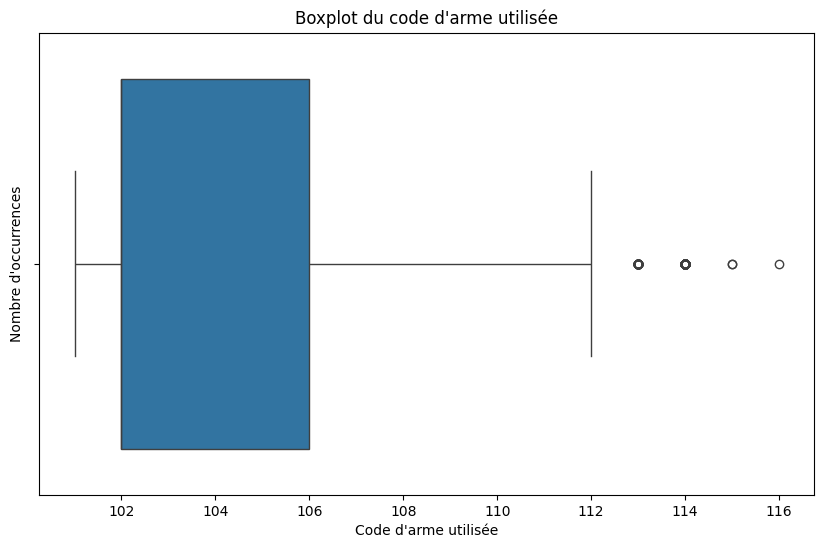

In [62]:
# Tracer le boxplot du code d'arme utilisée
plt.figure(figsize=(10, 6))
sns.boxplot(x='Weapon Used Cd', data=X)
plt.title('Boxplot du code d\'arme utilisée')
plt.xlabel('Code d\'arme utilisée')
plt.ylabel('Nombre d\'occurrences')
plt.show()


##### => on remarque qu'il y'a des outlayers je vais les supprimer.

Supprimer les outlayers de weapon used cd:

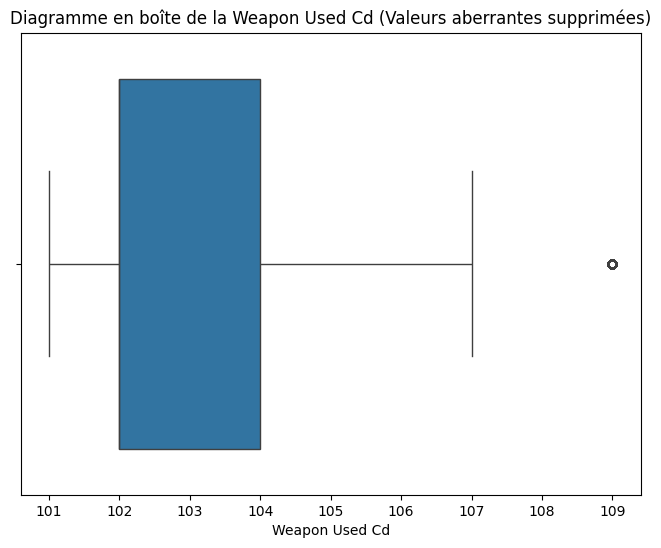

In [63]:
# Définir les bornes inférieure et supérieure ajustées pour weapon used cd
limite_inferieure_WeaponUsedCd_ajustee = 100
limite_superieure_WeaponUsedCd_ajustee = 109

# Identifier les valeurs aberrantes dans la colonne LAT
valeurs_aberrantes_WeaponUsedCd = X[(X['Weapon Used Cd'] < limite_inferieure_WeaponUsedCd_ajustee) | (X['Weapon Used Cd'] > limite_superieure_WeaponUsedCd_ajustee)]

# Supprimer les valeurs aberrantes de la colonne LAT du DataFrame d'origine
X = X.drop(valeurs_aberrantes_WeaponUsedCd.index)

# Afficher le boxplot pour la colonne LAT après suppression des valeurs aberrantes
plt.figure(figsize=(8, 6))
sns.boxplot(x=X['Weapon Used Cd'])
plt.title('Diagramme en boîte de la Weapon Used Cd (Valeurs aberrantes supprimées)')
plt.show()

* ***Répartition des fonctionnalités"***


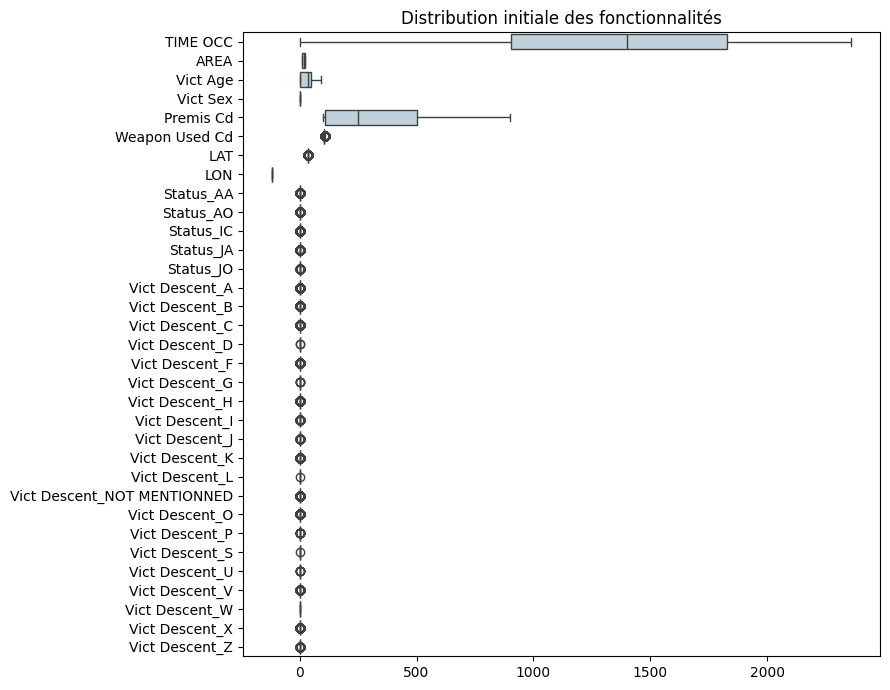

In [64]:
# voir la distribution initiale
plt.figure(figsize=(9,7))

ax = sns.boxplot(data=X, orient="h", color='#BBD2E1')
ax.set_title('Distribution initiale des fonctionnalités')


plt.tight_layout()

plt.show()

Le code que vous avez fourni génère des variables fictives (dummies) pour les colonnes 'Status' et 'Vict Descent' dans le DataFrame X. Les variables fictives sont utilisées pour représenter des variables catégorielles sous forme de variables binaires.

Après l'application de pd.get_dummies(), de nouvelles colonnes sont créées dans X pour chaque valeur unique des colonnes spécifiées comme dummy_cols. Chaque nouvelle colonne aura une valeur de 1 si la catégorie correspondante est présente dans la ligne d'origine, sinon elle aura une valeur de 0.

Dans la sortie, nous pouvons voir les nouvelles colonnes créées pour les variables Status et Vict Descent. Chaque colonne correspond à une valeur unique trouvée dans ces colonnes d'origine. Par exemple, si une observation avait un statut "AA", la colonne correspondante dans le DataFrame serait 1, sinon elle serait 0.

> ***Ré-échantillonnage des données RandomOverSampler***





* ***Application du réechantillonnage RandomOverSampler***



In [65]:
# Concaténer X et y le long de l'axe des colonnes
df1 = pd.concat([X, y], axis=1)

In [66]:
y = y.iloc[:59441]

##### => réduire la taille de y à 59 441 lignes pour avoir la meme taille que X

In [67]:
from imblearn.over_sampling import RandomOverSampler
import numpy as np

# Check data shapes before resampling
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

# Initialize RandomOverSampler
ros = RandomOverSampler(random_state=42)

# Resample the dataset
X_resampled, y_resampled = ros.fit_resample(X, np.ravel(y))  # Utilisez np.ravel pour convertir y en un tableau 1D

# Check data shapes after resampling
print("Shape of X_resampled:", X_resampled.shape)
print("Shape of y_resampled:", y_resampled.shape)


Shape of X: (59441, 33)
Shape of y: (59441, 1)
Shape of X_resampled: (763458, 33)
Shape of y_resampled: (763458,)


##### Avant le rééchantillonnage :

X : (59441, 33) - 59 441 exemples avec 33 fonctionnalités.
y : (59441, 1) - 59 441 étiquettes de classe.
Après le rééchantillonnage :

X_resampled : (763458, 33) - 763 458 exemples avec 33 fonctionnalités.
y_resampled : (763458,) - 763 458 étiquettes de classe.
Le rééchantillonnage a considérablement augmenté la taille de l'ensemble de données, passant de 59 441 à 763 458 exemples, en équilibrant les différentes classes de la variable cible "crimetype".

=> on a utilisé RandomOverSampler pour le réchantillonage du data

* ***Voir résultat du réechantillonnage***

In [68]:
# voir si le sur-échantillonnage et et sous-échantillonnage sont bien effectuer ou non
print('-'*45+'\nPROPORTION DE CLASSE'+'\n'+'-'*45,
      f'\nAvant rééchantillonnage: {Counter(y)}',
      f'\nAprés rééchantillonnage : {Counter(y_resampled)}')

---------------------------------------------
PROPORTION DE CLASSE
--------------------------------------------- 
Avant rééchantillonnage: Counter({'crimetype': 1}) 
Aprés rééchantillonnage : Counter({95: 6878, 89: 6878, 102: 6878, 100: 6878, 103: 6878, 87: 6878, 13: 6878, 75: 6878, 14: 6878, 30: 6878, 86: 6878, 58: 6878, 63: 6878, 39: 6878, 107: 6878, 105: 6878, 32: 6878, 91: 6878, 108: 6878, 45: 6878, 11: 6878, 46: 6878, 34: 6878, 9: 6878, 6: 6878, 12: 6878, 33: 6878, 73: 6878, 44: 6878, 2: 6878, 20: 6878, 81: 6878, 54: 6878, 55: 6878, 67: 6878, 79: 6878, 16: 6878, 74: 6878, 104: 6878, 80: 6878, 90: 6878, 59: 6878, 101: 6878, 24: 6878, 76: 6878, 0: 6878, 66: 6878, 65: 6878, 109: 6878, 71: 6878, 19: 6878, 85: 6878, 69: 6878, 3: 6878, 22: 6878, 38: 6878, 15: 6878, 29: 6878, 21: 6878, 94: 6878, 47: 6878, 23: 6878, 52: 6878, 10: 6878, 78: 6878, 26: 6878, 61: 6878, 60: 6878, 1: 6878, 35: 6878, 48: 6878, 93: 6878, 57: 6878, 62: 6878, 40: 6878, 8: 6878, 49: 6878, 92: 6878, 31: 6878, 28: 687

##### =>Analyse de résultat:
le suréchantillonnage (oversampling) a été effectué avec succès car la proportion des différentes classes de la variable cible "crimetype" est maintenant équilibrée. Avant le rééchantillonnage, il y avait une seule classe, tandis qu'après le rééchantillonnage, nous avons un compte égal de chaque classe.

Avant rééchantillonnage: Counter({'crimetype': 1})
Après rééchantillonnage : Counter({95: 6878, 89: 6878, 102: 6878, 100: 6878, 103: 6878, ...})

Chaque classe de "crimetype" a maintenant 6878 occurrences, ce qui indique que le suréchantillonnage a été correctement effectué pour équilibrer les données.

> ***Création du Data Set pour la corrélation aprés prétraitement***

In [69]:
# concaténation des features et la target aprés prétraitement
Xr_df = pd.DataFrame(X_resampled,columns=X.columns)
yr_df= pd.DataFrame(y_resampled)

correlation2 = pd.concat([Xr_df, yr_df],axis=1)

# renomer le colonne du variable cible
correlation2 = correlation2.rename(columns={0: 'crimetype'})
correlation2

,TIME OCC,AREA,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,LAT,LON,Status_AA,Status_AO,...,Vict Descent_NOT MENTIONNED,Vict Descent_O,Vict Descent_P,Vict Descent_S,Vict Descent_U,Vict Descent_V,Vict Descent_W,Vict Descent_X,Vict Descent_Z,crimetype
0,1925,17,0.0,NaN,203.0,NaN,34.2864,-118.5021,0,1,...,0,0,0,0,0,0,0,1,0,95
1,1,10,46.0,0.0,501.0,NaN,34.1748,-118.5228,0,0,...,0,0,0,0,0,0,1,0,0,89
2,1200,10,34.0,0.0,502.0,NaN,34.1745,-118.5383,0,0,...,0,0,0,0,0,0,0,0,0,89
3,1200,10,39.0,1.0,502.0,NaN,34.1745,-118.5383,0,0,...,0,0,0,0,0,0,0,0,0,89
4,1700,10,45.0,0.0,203.0,NaN,34.1660,-118.5033,0,0,...,0,0,0,0,0,0,1,0,0,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763453,1200,10,26.0,1.0,501.0,NaN,34.1698,-118.5308,0,0,...,0,1,0,0,0,0,0,0,0,110
763454,1200,10,26.0,1.0,501.0,NaN,34.1698,-118.5308,0,0,...,0,1,0,0,0,0,0,0,0,110
763455,1200,10,26.0,1.0,501.0,NaN,34.1698,-118.5308,0,0,...,0,1,0,0,0,0,0,0,0,110
763456,1200,10,26.0,1.0,501.0,NaN,34.1698,-118.5308,0,0,...,0,1,0,0,0,0,0,0,0,110


> ***Matrice de corrélation aprés prétraitement***

In [70]:
Xr_df.shape

(763458, 33)

In [71]:
# avoir la data aprés prétraitement
correlation2.to_csv("DataPréprocessing.csv", index=False)

Text(0.5, 1.0, 'Corrélation entre toutes les variables explicatives après prétraitement')

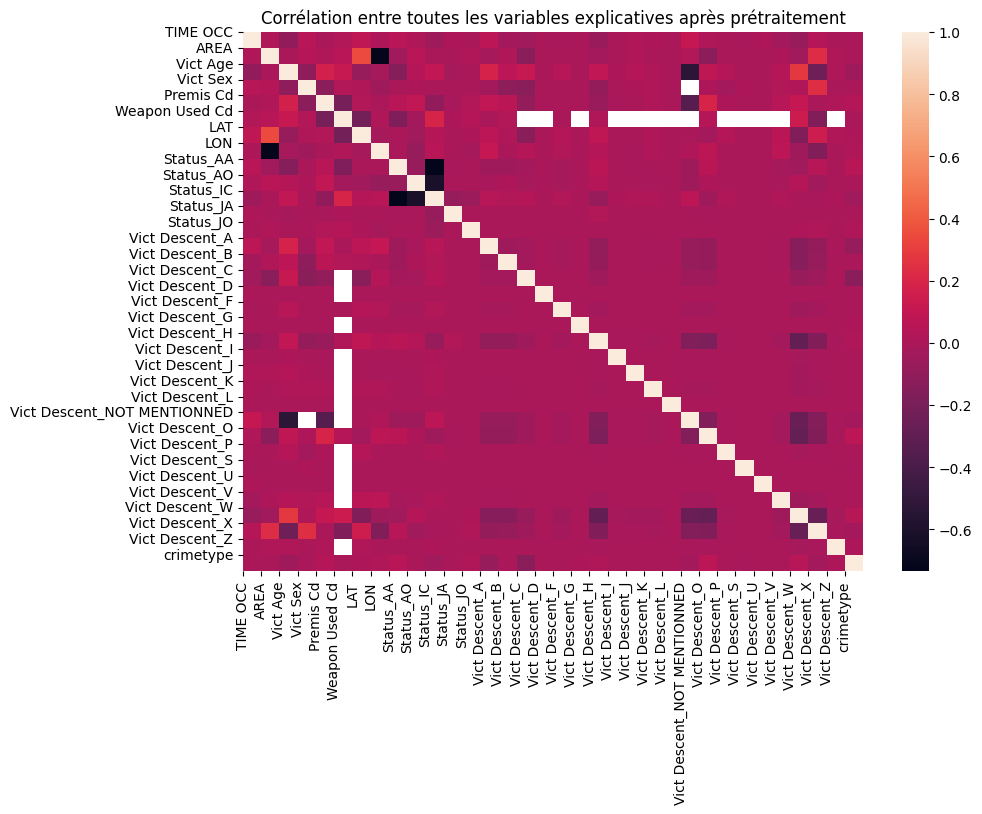

In [72]:
# matrice de corrélation entre tous les variables après prétraitement
plt.figure(figsize=(10,7))
sns.heatmap(correlation2.corr(method='pearson'))
plt.xticks(range(len(correlation2.columns)), correlation2.columns, rotation=90)
plt.yticks(range(len(correlation2.columns)), correlation2.columns)
plt.title('Corrélation entre toutes les variables explicatives après prétraitement')

Text(0.5, 1.0, 'Carte thérmique des corrélations entre les variables explicatives apres pré-traitement')

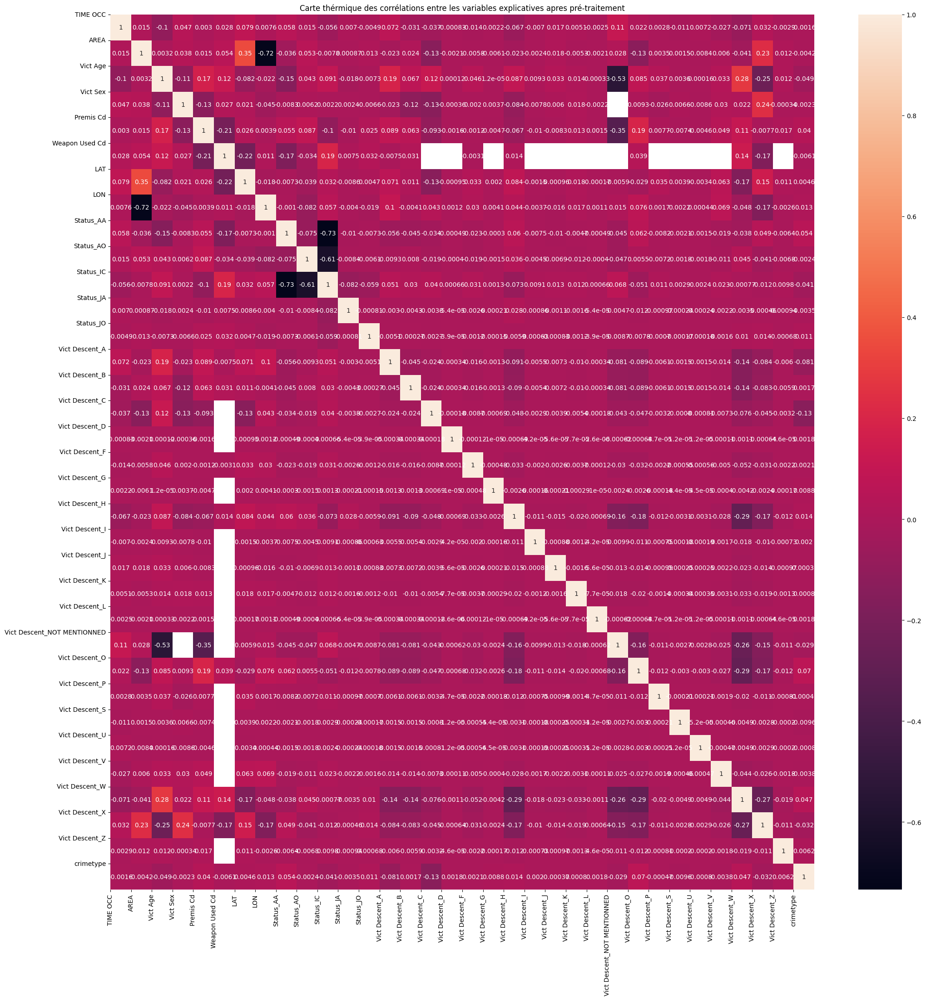

In [73]:
# voir la carte thermique reflétant la corrélation aprés prétraitement
plt.figure(figsize=(25, 25))
sns.heatmap(correlation2.corr(method='pearson'), annot=True)
plt.xticks(range(len(correlation2.columns)), correlation2.columns, rotation=90)
plt.yticks(range(len(correlation2.columns)), correlation2.columns)
plt.title('Carte thérmique des corrélations entre les variables explicatives apres pré-traitement')

=> maintenant il est facile pour nous de visualiser la coorélation entre les colonnes et spécifiquement entre notre colonne cible crimetype et les autres colonnes 

Text(0.5, 1.0, 'Corrélation entre les variables explicative et la variable cible')

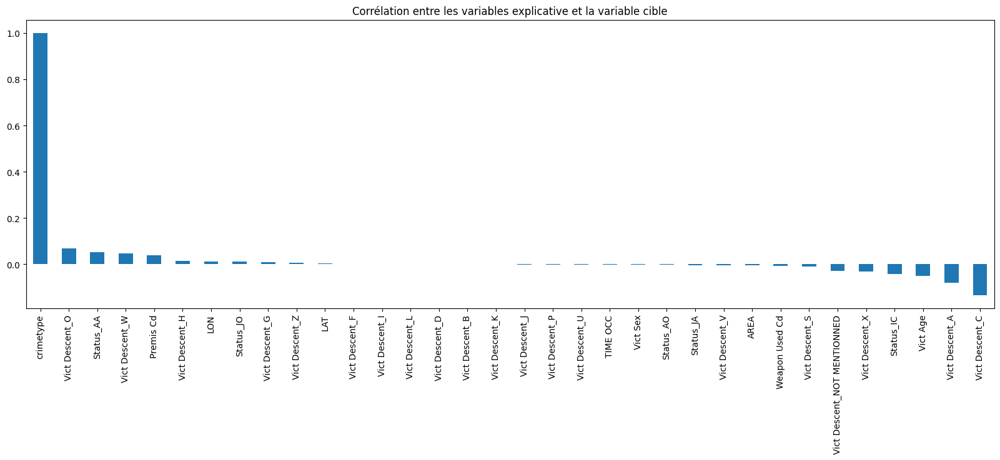

In [74]:
# voir les relations entre les varibales explicatives avec notre bariable cible 
plt.figure(figsize=(20,6))
correlation2.corr()['crimetype'].sort_values(ascending = False).plot(kind='bar')
plt.title('Corrélation entre les variables explicative et la variable cible')

##### =>Analyse:
Cette analyse de corrélation entre les variables explicatives et la variable cible (crimetype) révèle plusieurs informations importantes :

La variable explicative la plus fortement corrélée avec la variable cible (crimetype) est elle-même, ce qui est attendu puisqu'il s'agit de la corrélation de chaque variable avec elle-même, ce qui donne une corrélation maximale de 1.
Parmi les autres variables explicatives, on observe des corrélations positives modérées avec des valeurs inférieures à 0.1, telles que "vict_descent_O" avec une corrélation de 0.08, "status_AA" avec 0.06, "vict_descent_W" avec 0.05, "vict_descent_H" avec 0.03, "vict_descent_G" avec 0.03, "vict_descent_Z" avec 0.03, "LON" avec 0.02, et "status_JO" avec 0.03.
Les autres variables explicatives ont des corrélations proches de zéro, ce qui indique une faible corrélation linéaire avec la variable cible.
Il est important de noter que la corrélation ne capture que les relations linéaires entre les variables. Des relations non linéaires ou des relations de dépendance plus complexes peuvent ne pas être détectées par cette mesure.

In [75]:
# voir les top 5 fonctionnalités les plus corréler positivement
print('Les 7 fonctionnalités ayant la plus forte corrélation positive avec la cible crimetype')
print('-'*45)
print(df1.corr()['crimetype'].sort_values(ascending=False).head(8))

Les 7 fonctionnalités ayant la plus forte corrélation positive avec la cible crimetype
---------------------------------------------
crimetype                      1.000000
Vict Descent_NOT MENTIONNED    0.333812
Status_AO                      0.063232
Weapon Used Cd                 0.060146
LAT                            0.041759
TIME OCC                       0.025395
Status_AA                      0.025110
AREA                           0.016543
Name: crimetype, dtype: float64


##### => Analyse de résultat: 
Ces valeurs représentent les corrélations les plus fortes (positives) entre les caractéristiques et la variable cible "crimetype". Voici une analyse de ces corrélations :

Vict Descent_NOT MENTIONNED : Cette caractéristique présente la plus forte corrélation positive avec la variable cible. Cela suggère qu'une mention spécifique concernant la descendance de la victime (non mentionnée dans ce cas) est fortement associée à certains types de crimes.
Status_AO : La présence du statut AO a également une corrélation positive avec le type de crime. Cela peut indiquer qu'un statut spécifique est associé à des types de crimes particuliers.
Weapon Used Cd : La corrélation positive avec l'utilisation d'une arme suggère que certains types de crimes sont plus susceptibles d'impliquer l'utilisation d'une arme.
LAT : La latitude a une corrélation positive avec le type de crime, indiquant qu'il pourrait y avoir une variation géographique dans la nature des crimes.
TIME OCC : L'heure à laquelle le crime a eu lieu a également une corrélation positive, ce qui peut suggérer des variations temporaires dans les types de crimes commis.
Status_AA : La présence du statut AA est également légèrement corrélée positivement avec le type de crime.
AREA : La zone où le crime a eu lieu a une corrélation positive mais plus faible avec le type de crime.

In [76]:
# voir les top 5 fonctionnalités les plus corréler négativement
print('Les 10 fonctionnalités ayant la plus forte corrélation négative avec la cible crimetype')
print('-'*45+'\n')
print(df1.corr()['crimetype'].sort_values(ascending=True).head(10))

Les 10 fonctionnalités ayant la plus forte corrélation négative avec la cible crimetype
---------------------------------------------

Vict Age         -0.177139
Vict Descent_O   -0.101753
Vict Descent_W   -0.090998
Vict Sex         -0.075684
Premis Cd        -0.073698
Status_IC        -0.063824
Vict Descent_X   -0.050462
Vict Descent_H   -0.039900
Vict Descent_A   -0.033992
Vict Descent_B   -0.032859
Name: crimetype, dtype: float64


##### =>Analyse de résultat :
Voici une analyse des fonctionnalités ayant la corrélation négative la plus forte avec la variable cible "crimetype" :

Vict Age : La variable "Vict Age" (âge de la victime) présente la corrélation négative la plus forte avec le type de crime. Cela suggère qu'un âge plus élevé de la victime est associé à certains types de crimes.
Vict Descent_O : La descendance "O" de la victime a une corrélation négative significative avec le type de crime. Cela peut indiquer qu'une descendance spécifique est moins fréquente dans certains types de crimes.
Vict Descent_W : De même, la descendance "W" de la victime a une corrélation négative avec le type de crime.
Vict Sex : Le sexe de la victime présente également une corrélation négative avec le type de crime, ce qui suggère que le sexe de la victime peut influencer la nature du crime.
Premis Cd : Le code du prémis (lieu du crime) a également une corrélation négative avec le type de crime. Cela peut indiquer que certains types de crimes sont moins susceptibles de se produire dans certains lieux.
Status_IC : La présence du statut IC est également négativement corrélée avec le type de crime.
Vict Descent_X : La descendance "X" de la victime a également une corrélation négative avec le type de crime.
Vict Descent_H : La descendance "H" de la victime a une corrélation négative avec le type de crime.
Vict Descent_A : La descendance "A" de la victime a également une corrélation négative avec le type de crime.
Vict Descent_B : La descendance "B" de la victime a également une corrélation négative avec le type de crime.

**6. Diviser la base de données en une base de données test et d'entrainement après prétraitement en utilisant SMOTEENN et MinMaxScaler**

In [77]:
# créer Xr_train et yr_train
Xr_train, Xr_test, yr_train, yr_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42) 

print('Xr_train taille: ', Xr_train.shape)
print('Xr_test taille: ', Xr_test.shape)
print('yr_train taille: ', yr_train.shape)
print('yr_test taille: ', yr_test.shape)

Xr_train taille:  (610766, 33)
Xr_test taille:  (152692, 33)
yr_train taille:  (610766,)
yr_test taille:  (152692,)


# **Evaluation du modèle**

** Modèle : Random Forest **



In [78]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, precision_score, recall_score
from sklearn.multiclass import OneVsRestClassifier

# Réduire la taille des données d'entraînement
Xr_train_small, _, yr_train_small, _ = train_test_split(Xr_train, yr_train, train_size=0.01, random_state=42)

# Créer le modèle de forêt aléatoire
model_rf = RandomForestClassifier()

# Entraîner le modèle sur les données d'entraînement réduites
model_rf.fit(Xr_train_small, yr_train_small)

# Créer un classifieur One-vs-Rest
ovr_classifier = OneVsRestClassifier(model_rf)

# Adapter le classifieur sur les données d'entraînement
ovr_classifier.fit(Xr_train_small, yr_train_small)

# Prédire les probabilités pour chaque classe
pred_prob_rf = ovr_classifier.predict_proba(Xr_test)
# Faire la prédiction sur les données de test
pred_rf = ovr_classifier.predict(Xr_test)
# Calculer le score ROC AUC
roc_auc = roc_auc_score(yr_test, pred_prob_rf, multi_class='ovr')
# Calculer la précision
precision = precision_score(pred_rf, yr_test, average='weighted')
# Afficher le score ROC AUC
print(f'ROC AUC Score: {roc_auc}\n')
# Afficher la précision
print('-'*45+'\nValeur exact du Précision'+'\n'+'-'*45,
      f'\n{precision}\n')

# Afficher les résultats
print('-'*45+'\nMatrice de confusion du modèle : Forêt aléatoire'+'\n'+'-'*45,
      f'\n{confusion_matrix(pred_rf,yr_test)}\n',
      '-'*45+'\nRapport de classification du modèle : Forêt aléatoire'+'\n'+'-'*45,
      f'\n{classification_report(pred_rf,yr_test)}\n',
      '-'*45+'\nValeur exact d\'Accuracy'+'\n'+'-'*45,
      f'\n{model_rf.score(Xr_test, yr_test)}\n',
      '-'*45+'\nValeur exact du Précision'+'\n'+'-'*45,
      f'\n{precision_score(pred_rf,yr_test, average="weighted")}\n',
      '-'*45+'\nValeur exact du Recall'+'\n'+'-'*45,
      f'\n{recall_score(pred_rf,yr_test, average="weighted")}\n')



ROC AUC Score: 0.875205015834542

---------------------------------------------
Valeur exact du Précision
--------------------------------------------- 
0.7138066694352325

---------------------------------------------
Matrice de confusion du modèle : Forêt aléatoire
--------------------------------------------- 
[[ 627    0   26 ...   17   13    0]
 [   0 1264    7 ...   13   11    0]
 [  31    0  121 ...   26   30    0]
 ...
 [  21    0   36 ...  113   30    0]
 [  30    0   20 ...   14  315    0]
 [   0    0    3 ...    1    0 1404]]
 ---------------------------------------------
Rapport de classification du modèle : Forêt aléatoire
--------------------------------------------- 
              precision    recall  f1-score   support

           0       0.44      0.54      0.49      1171
           1       0.94      0.78      0.85      1616
           2       0.09      0.11      0.10      1078
           3       0.62      0.50      0.56      1811
           4       1.00      0.98     

Analyse des résultats, voici quelques points à considérer :

Précision (Precision) : La précision mesure la proportion d'observations positives prédites correctement parmi toutes les observations prédites comme positives. Une valeur élevée de précision indique que le modèle classe correctement la plupart des observations positives.
Rappel (Recall) : Le rappel mesure la proportion d'observations positives réelles prédites correctement parmi toutes les observations réellement positives. Une valeur élevée de rappel indique que le modèle identifie correctement la plupart des observations positives.
Support : Le support est le nombre d'occurrences de chaque classe dans les données de test.

In [79]:
print("Nombre de fonctionnalités dans les données de test :", Xr_test.shape[1])

Nombre de fonctionnalités dans les données de test : 33


In [80]:
print("Noms des fonctionnalités dans les données de test :", Xr_test.columns)


Noms des fonctionnalités dans les données de test : Index(['TIME OCC', 'AREA', 'Vict Age', 'Vict Sex', 'Premis Cd',
       'Weapon Used Cd', 'LAT', 'LON', 'Status_AA', 'Status_AO', 'Status_IC',
       'Status_JA', 'Status_JO', 'Vict Descent_A', 'Vict Descent_B',
       'Vict Descent_C', 'Vict Descent_D', 'Vict Descent_F', 'Vict Descent_G',
       'Vict Descent_H', 'Vict Descent_I', 'Vict Descent_J', 'Vict Descent_K',
       'Vict Descent_L', 'Vict Descent_NOT MENTIONNED', 'Vict Descent_O',
       'Vict Descent_P', 'Vict Descent_S', 'Vict Descent_U', 'Vict Descent_V',
       'Vict Descent_W', 'Vict Descent_X', 'Vict Descent_Z'],
      dtype='object')


In [81]:
# Nouvelles données pour prédiction
new_data = [
    [19,29 ,6 , 20, 0.2, 247, 41, 5, 
    0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
]

# Créer un DataFrame à partir des nouvelles données
new_data_df = pd.DataFrame(new_data, columns=[
    'TIME OCC', 'AREA', 'Vict Age', 'Vict Sex', 'Premis Cd', 'Weapon Used Cd', 'LAT', 'LON', 
    'Status_AA', 'Status_AO', 'Status_IC', 'Status_JA', 'Status_JO', 
    'Vict Descent_A', 'Vict Descent_B', 'Vict Descent_C', 'Vict Descent_D', 
    'Vict Descent_F', 'Vict Descent_G', 'Vict Descent_H', 'Vict Descent_I', 
    'Vict Descent_J', 'Vict Descent_K', 'Vict Descent_L', 'Vict Descent_NOT MENTIONNED', 
    'Vict Descent_O', 'Vict Descent_P', 'Vict Descent_S', 'Vict Descent_U', 
    'Vict Descent_V', 'Vict Descent_W', 'Vict Descent_X', 'Vict Descent_Z'])

# Faire la prédiction
prediction = ovr_classifier.predict(new_data_df)
positions_predites = [y['crimetype'].tolist().index(valeur_predite) for valeur_predite in prediction]
valeurs_predites = [y_list[position] for position in positions_predites]
print("Type de crime prédit :", valeurs_predites)



Type de crime prédit : ['VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)']


##### =>Voila qu'est ce que j'ai fait ##### ici puisque moi j'ai déja covertit le crimetype en numérique j'ai cherché la position du résultat de préduction dans y et chercher son correspandant en y_list qui contient la liste de type de crimes catégorielles . dans ce test j'ai fait la préduction de crimetype a partir de plusieurs facteurs qui sont 'TIME OCC', 'AREA', 'Vict Age', 'Vict Sex', 'Premis Cd', 'Weapon Used Cd', 'LAT', 'LON', 'Status_AA', 'Status_AO', 'Status_IC', 'Status_JA', 'Status_JO', 'Vict Descent_A', 'Vict Descent_B', 'Vict Descent_C', 'Vict Descent_D', 'Vict Descent_F', 'Vict Descent_G', 'Vict Descent_H', 'Vict Descent_I', 'Vict Descent_J', 'Vict Descent_K', 'Vict Descent_L', 'Vict Descent_NOT MENTIONNED', 'Vict Descent_O', 'Vict Descent_P', 'Vict Descent_S', 'Vict Descent_U', 'Vict Descent_V', 'Vict Descent_W', 'Vict Descent_X', 'Vict Descent_Z'puisque moi avec dummy variables j'ai changé tous en numériques d'ou le nombre de colonnes augmentent.

[0.19310463 0.04014751 0.12427117 0.03012697 0.12995776 0.00309044
 0.18626788 0.18364311 0.0099949  0.00912493 0.01201588 0.00025126
 0.00034013 0.00693772 0.00677681 0.00637222 0.         0.00183084
 0.         0.01241704 0.00020611 0.00066513 0.00069025 0.
 0.00563187 0.01063577 0.0005083  0.         0.         0.00327274
 0.01281482 0.00837445 0.00052935]


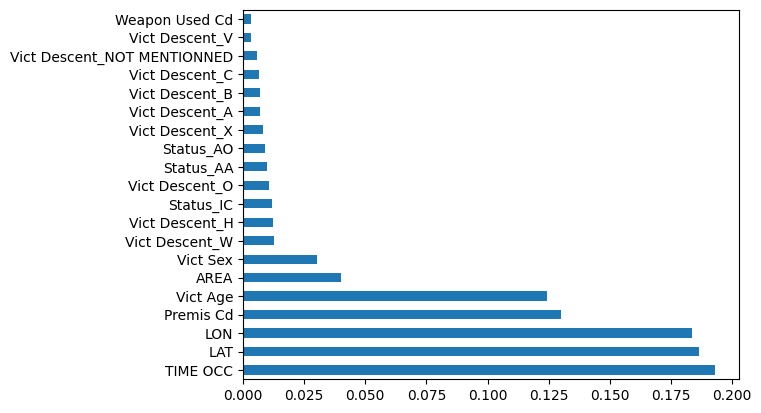

In [82]:
# voir les Features les plus impotantes pour ce modèle
print(model_rf.feature_importances_)
feat_importances = pd.Series(model_rf.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

##### => Analyse de résultat:
La caractéristique la plus importante est TIME OCC avec une importance de 0.19359504. Cela indique que l'heure à laquelle le crime a eu lieu est un facteur crucial dans la prédiction du type de crime.
Les caractéristiques LAT (latitude) et LON (longitude) viennent ensuite, avec des importances de 0.18418367 et 0.18389741 respectivement. Cela suggère que la localisation géographique est également un élément essentiel dans la prédiction du type de crime.
Premis Cd (code de prémisse) est également significatif avec une importance de 0.13128362, ce qui indique que le lieu où le crime a eu lieu est un facteur important à considérer.
Vict Age (âge de la victime) a une importance de 0.12434283, ce qui suggère que l'âge de la victime est également un élément clé dans la prédiction du type de crime.
D'autres caractéristiques telles que Vict Sex (sexe de la victime), Status_AA et Status_AO ont également une certaine importance, bien qu'elles soient moins significatives par rapport aux caractéristiques mentionnées ci-dessus.
Certaines caractéristiques comme Vict Descent_L et Vict Descent_U ont une importance nulle, ce qui signifie qu'elles n'apportent pas de contribution significative à la prédiction du type de crime dans ce modèle.
Cette analyse vous donne un aperçu des caractéristiques les plus importantes dans mon modèle Random Forest et de leur impact sur la prédiction du type de crime.

In [83]:
feature_importances1 = pd.DataFrame(model_rf.feature_importances_,index = Xr_df.columns,columns=['importance']).sort_values('importance',ascending=False)
feature_importances1

,importance
TIME OCC,0.193105
LAT,0.186268
LON,0.183643
Premis Cd,0.129958
Vict Age,0.124271
AREA,0.040148
Vict Sex,0.030127
Vict Descent_W,0.012815
Vict Descent_H,0.012417
Status_IC,0.012016


##### =>Analyse de résultat:
Les caractéristiques les plus importantes dans l'ordre décroissant de leur importance sont :
TIME OCC : Cela indique que l'heure à laquelle le crime a eu lieu est la caractéristique la plus importante pour la prédiction de la variable cible. Cela pourrait suggérer des tendances horaires dans les données de crime.
LAT : La latitude où le crime a eu lieu est la deuxième caractéristique la plus importante.
LON : La longitude où le crime a eu lieu suit de près la latitude en termes d'importance.
Premis Cd : Le code de prémisse (lieu où le crime a eu lieu) est également une caractéristique importante pour la prédiction.
Vict Age : L'âge de la victime est également une caractéristique significative pour prédire le type de crime.
Les caractéristiques telles que AREA (zone où le crime a eu lieu), Vict Sex (sexe de la victime) et d'autres caractéristiques de descendance ont également une certaine importance, mais elles sont moins significatives par rapport aux caractéristiques susmentionnées.
Certaines caractéristiques, comme Vict Descent_G, Vict Descent_D, et d'autres encore, ont une importance négligeable. Cela peut signifier qu'elles ne contribuent pas beaucoup à la prédiction du type de crime dans le modèle actuel.
En résumé, cette analyse met en lumière les caractéristiques les plus influentes dans la prédiction du type de crime, ce qui peut être utile pour comprendre quelles variables sont les plus pertinentes dans mon modèle et dans quelles mesures elles contribuent à la prédiction de la variable cible.